In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date, timedelta
from xgboost import XGBRegressor
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_pacf
import warnings
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
plt.style.use('fivethirtyeight')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
british = pd.read_csv('/content/drive/MyDrive/Final Project /Dataset dan Project/dataset 5/BritishMart.csv')
ukmart = pd.read_csv('/content/drive/MyDrive/Final Project /Dataset dan Project/dataset 5/UKMart.csv')

In [ ]:
british.head()

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,BritishMart,1.35,1.35,l,Alpro Oat Long Life Drink,drinks,False,2021-01-01
1,BritishMart,2.10,2.10,l,Alpro Almond Chilled Drink,drinks,False,2021-01-01
2,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Strawberr…,drinks,False,2021-01-01
3,BritishMart,2.10,2.10,l,Alpro Soya Chilled Drink,drinks,False,2021-01-01
4,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Lemon & Lim…,drinks,False,2021-01-01


In [ ]:
ukmart.head()

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,UKMart,1.50,3.00,kg,Alpro Plain Unsweetened No Sugars Plant-Based ...,fresh_food,False,2021-01-01
1,UKMart,1.65,0.82,l,Cravendale Filtered Fresh Skimmed Milk Fresher...,fresh_food,False,2021-01-01
2,UKMart,1.65,0.82,l,Cravendale Filtered Fresh Whole Milk 2L Freshe...,fresh_food,False,2021-01-01
3,UKMart,0.90,0.90,kg,Sainsbury's Fairtrade Bananas Loose,fresh_food,True,2021-01-01
4,UKMart,1.45,0.64,l,Sainsbury's British Semi Skimmed Milk 2.27L (4...,fresh_food,True,2021-01-01


In [ ]:
ukmart.shape

(1387644, 8)

In [ ]:
british.shape

(979866, 8)

# DATA PREPARATION

In [ ]:
#Menggabungkan kedua dataset dari BritishMart dan UKMart
df = pd.concat([british, ukmart])

In [ ]:
df

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,BritishMart,1.35,1.35,l,Alpro Oat Long Life Drink,drinks,False,2021-01-01
1,BritishMart,2.10,2.10,l,Alpro Almond Chilled Drink,drinks,False,2021-01-01
2,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Strawberr…,drinks,False,2021-01-01
3,BritishMart,2.10,2.10,l,Alpro Soya Chilled Drink,drinks,False,2021-01-01
4,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Lemon & Lim…,drinks,False,2021-01-01
...,...,...,...,...,...,...,...,...
1387639,UKMart,2.70,14.21,kg,Jarlsberg Original 190g,fresh_food,False,2022-04-30
1387640,UKMart,3.00,5.00,kg,Sainsbury's Moroccan Spiced Chicken & Chickpea...,fresh_food,True,2022-05-01
1387641,UKMart,1.25,5.50,kg,"Ginsters Cornish Pasty, 227g",fresh_food,False,2022-05-02
1387642,UKMart,3.00,30.00,kg,"Sainsbury's British Corned Beef Slices, Taste ...",fresh_food,True,2022-05-03


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2367510 entries, 0 to 1387643
Data columns (total 8 columns):
 #   Column          Dtype  
---  ------          -----  
 0   nama_toko       object 
 1   harga_pound     float64
 2   harga_per_unit  float64
 3   unit            object 
 4   nama            object 
 5   kategori        object 
 6   brand_sendiri   bool   
 7   tanggal         object 
dtypes: bool(1), float64(2), object(5)
memory usage: 146.8+ MB


In [ ]:
df['tanggal']= pd.to_datetime(df['tanggal'])

In [ ]:
nums=[i for i in df.columns if df[i].dtypes == 'float64']

In [ ]:
nums

['harga_pound', 'harga_per_unit']

####Missing values

In [ ]:
print(df.isnull().sum())

nama_toko           0
harga_pound         0
harga_per_unit    129
unit              129
nama                0
kategori            0
brand_sendiri       0
tanggal             0
dtype: int64


Terdapat 2 kolom yang masih ditemukan missing value yaitu pada kolom harga_pound dan harga_per_unit. Untuk menghandle missing value pada 2 kolom tersebut, kami memutuskan untuk menghapus nilai karna missing value hanya ditemukan sebanyak 129 data sehingga tidak terlalu berpengaruh ketika dihapus.

In [ ]:
df1 = df.dropna()

In [ ]:
print(df1.isnull().sum())

nama_toko         0
harga_pound       0
harga_per_unit    0
unit              0
nama              0
kategori          0
brand_sendiri     0
tanggal           0
dtype: int64


In [ ]:
df1.shape

(2367381, 8)

####Duplicated values

In [ ]:
print(df1.duplicated().sum())

445


In [ ]:
df1.drop_duplicates(inplace=True)

<ipython-input-49-1788250b656d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop_duplicates(inplace=True)


In [ ]:
print(df1.duplicated().sum())

0


In [ ]:
df1

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,BritishMart,1.35,1.35,l,Alpro Oat Long Life Drink,drinks,False,2021-01-01
1,BritishMart,2.10,2.10,l,Alpro Almond Chilled Drink,drinks,False,2021-01-01
2,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Strawberr…,drinks,False,2021-01-01
3,BritishMart,2.10,2.10,l,Alpro Soya Chilled Drink,drinks,False,2021-01-01
4,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Lemon & Lim…,drinks,False,2021-01-01
...,...,...,...,...,...,...,...,...
1387639,UKMart,2.70,14.21,kg,Jarlsberg Original 190g,fresh_food,False,2022-04-30
1387640,UKMart,3.00,5.00,kg,Sainsbury's Moroccan Spiced Chicken & Chickpea...,fresh_food,True,2022-05-01
1387641,UKMart,1.25,5.50,kg,"Ginsters Cornish Pasty, 227g",fresh_food,False,2022-05-02
1387642,UKMart,3.00,30.00,kg,"Sainsbury's British Corned Beef Slices, Taste ...",fresh_food,True,2022-05-03


### Handling Outlier

In [ ]:
# Calculate summary statistics
summary_stats = df1.describe()
summary_stats

,harga_pound,harga_per_unit
count,2.366936e+06,2.366936e+06
mean,5.269745e+00,3.905440e+01
std,7.031073e+00,4.833362e+02
min,1.000000e-02,0.000000e+00
25%,1.850000e+00,3.600000e+00
50%,3.000000e+00,7.980000e+00
75%,6.000000e+00,1.500000e+01
max,3.000000e+02,4.000000e+04



Persebaran data sebelum Outlier ditangani: 
        harga_pound  harga_per_unit
count  2.366936e+06    2.366936e+06
mean   5.269745e+00    3.905440e+01
std    7.031073e+00    4.833362e+02
min    1.000000e-02    0.000000e+00
25%    1.850000e+00    3.600000e+00
50%    3.000000e+00    7.980000e+00
75%    6.000000e+00    1.500000e+01
max    3.000000e+02    4.000000e+04


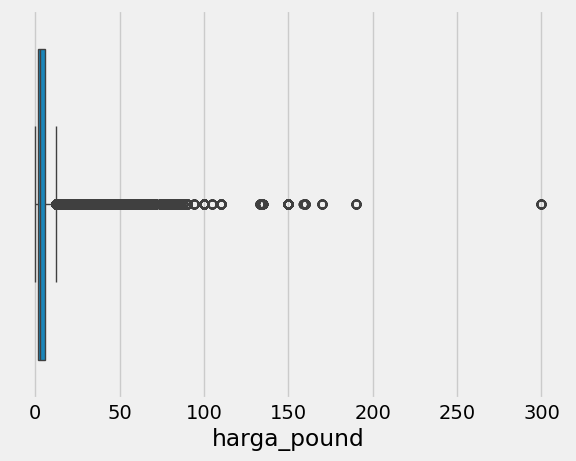

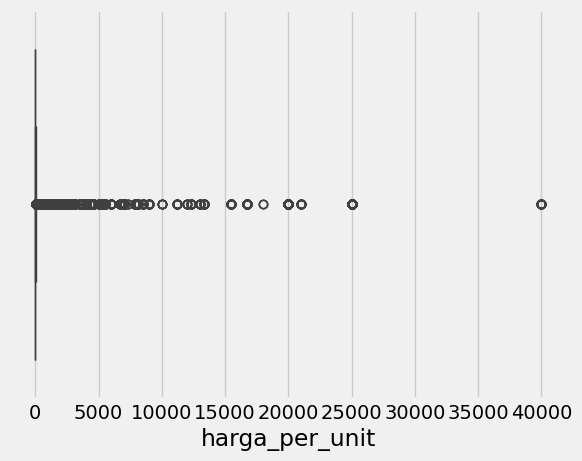

In [ ]:
print('\nPersebaran data sebelum Outlier ditangani: ')
print(df1[['harga_pound','harga_per_unit']].describe())

plt.figure()
sns.boxplot(x=df1['harga_pound'])
plt.show()
plt.figure()
sns.boxplot(x=df1['harga_per_unit'])
plt.show()

In [ ]:
df1["kategori"].unique()

array(['drinks', 'home', 'food_cupboard', 'fresh_food', 'frozen',
       'free-from', 'bakery', 'health_products', 'household',
       'baby_products', 'pets'], dtype=object)

In [ ]:
df1['brand_sendiri'] = df1['brand_sendiri'].astype('object')
print(df.dtypes)

nama_toko                 object
harga_pound              float64
harga_per_unit           float64
unit                      object
nama                      object
kategori                  object
brand_sendiri               bool
tanggal           datetime64[ns]
dtype: object


<ipython-input-55-bb3cfb32a14c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['brand_sendiri'] = df1['brand_sendiri'].astype('object')


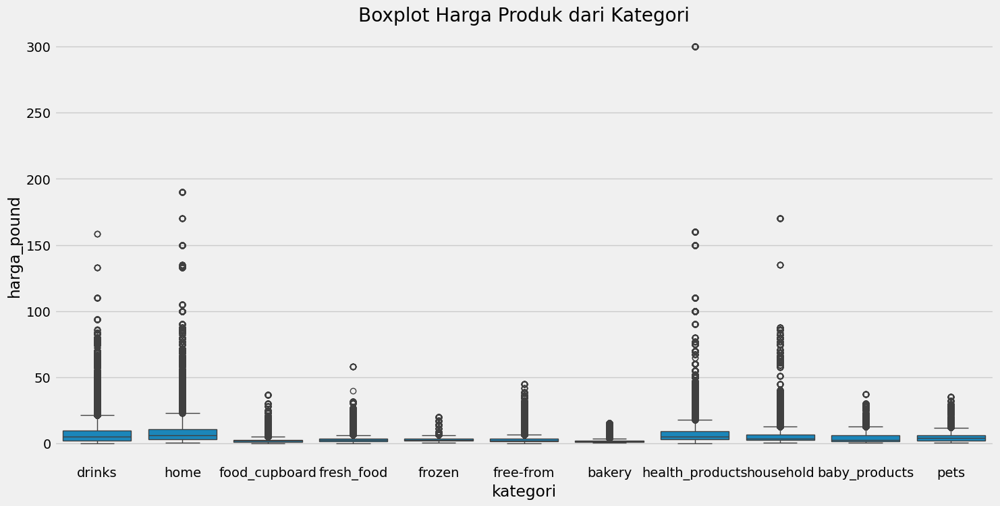

In [ ]:
fig, ax = plt.subplots(figsize=(16,8))
sns.boxplot(x='kategori', y='harga_pound', data=df1)
plt.title('Boxplot Harga Produk dari Kategori')
plt.show()

#**Exploratory Data Analysis (EDA)**

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2366936 entries, 0 to 1387643
Data columns (total 8 columns):
 #   Column          Dtype         
---  ------          -----         
 0   nama_toko       object        
 1   harga_pound     float64       
 2   harga_per_unit  float64       
 3   unit            object        
 4   nama            object        
 5   kategori        object        
 6   brand_sendiri   object        
 7   tanggal         datetime64[ns]
dtypes: datetime64[ns](1), float64(2), object(5)
memory usage: 162.5+ MB


In [ ]:
df1.describe()

,harga_pound,harga_per_unit
count,2.366936e+06,2.366936e+06
mean,5.269745e+00,3.905440e+01
std,7.031073e+00,4.833362e+02
min,1.000000e-02,0.000000e+00
25%,1.850000e+00,3.600000e+00
50%,3.000000e+00,7.980000e+00
75%,6.000000e+00,1.500000e+01
max,3.000000e+02,4.000000e+04


## Analisis Distribusi Tiap Toko

In [ ]:
#Automated EDA
#pip install dataprep

In [ ]:
from dataprep.eda import plot, plot_correlation, plot_missing, create_report


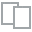
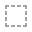
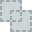
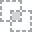
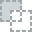
...
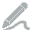
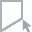
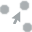
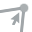
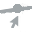

In [ ]:
#Analisis distribusi data
plot(df1)

### UKMart

In [ ]:
UK = df1[df1.nama_toko == 'UKMart']
UK

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,UKMart,1.50,3.00,kg,Alpro Plain Unsweetened No Sugars Plant-Based ...,fresh_food,False,2021-01-01
1,UKMart,1.65,0.82,l,Cravendale Filtered Fresh Skimmed Milk Fresher...,fresh_food,False,2021-01-01
2,UKMart,1.65,0.82,l,Cravendale Filtered Fresh Whole Milk 2L Freshe...,fresh_food,False,2021-01-01
3,UKMart,0.90,0.90,kg,Sainsbury's Fairtrade Bananas Loose,fresh_food,True,2021-01-01
4,UKMart,1.45,0.64,l,Sainsbury's British Semi Skimmed Milk 2.27L (4...,fresh_food,True,2021-01-01
...,...,...,...,...,...,...,...,...
1387639,UKMart,2.70,14.21,kg,Jarlsberg Original 190g,fresh_food,False,2022-04-30
1387640,UKMart,3.00,5.00,kg,Sainsbury's Moroccan Spiced Chicken & Chickpea...,fresh_food,True,2022-05-01
1387641,UKMart,1.25,5.50,kg,"Ginsters Cornish Pasty, 227g",fresh_food,False,2022-05-02
1387642,UKMart,3.00,30.00,kg,"Sainsbury's British Corned Beef Slices, Taste ...",fresh_food,True,2022-05-03



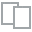
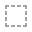
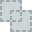
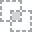
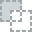
...
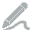
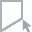
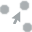
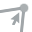
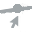

In [ ]:
#Analisis distribusi data
plot(UK)

### BritishMart

In [ ]:
BRITISH = df1[df1.nama_toko == 'BritishMart']
BRITISH

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,BritishMart,1.35,1.35,l,Alpro Oat Long Life Drink,drinks,False,2021-01-01
1,BritishMart,2.10,2.10,l,Alpro Almond Chilled Drink,drinks,False,2021-01-01
2,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Strawberr…,drinks,False,2021-01-01
3,BritishMart,2.10,2.10,l,Alpro Soya Chilled Drink,drinks,False,2021-01-01
4,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Lemon & Lim…,drinks,False,2021-01-01
...,...,...,...,...,...,...,...,...
979860,BritishMart,2.00,2.00,unit,Morrisons Wooden Plaque Sweet Cheeks,home,True,2022-02-25
979861,BritishMart,9.50,9.50,unit,Morrisons Wooden Rectangular Paddleboard,home,True,2022-02-26
979862,BritishMart,3.00,3.00,unit,Morrisons Wooden Turner,home,True,2022-02-27
979863,BritishMart,2.00,2.00,unit,Talking Tables Metallic Gold Slogan Napkin,home,False,2022-02-28



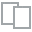
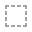
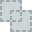
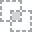
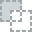
...
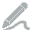
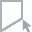
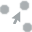
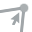
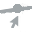

In [ ]:
#Analisis distribusi data
plot(BRITISH)

##Analisis kolom nama atau nama produk

In [ ]:
df1.nama.unique()

array(['Alpro Oat Long Life Drink', 'Alpro Almond Chilled Drink',
       'Volvic Touch of Fruit Strawberr…', ...,
       'The Gym Kitchen Chicken Tikka 400g',
       'Sanex Moisturising Bath Soak 570ml',
       'Habitat Set of 3 Stainless Steel Refill Bottles 500ml'],
      dtype=object)

***melihat statistik kolom nama produk***

In [ ]:
print("banyak nama produk = ",len(df1.nama.unique()))

banyak nama produk =  56012


In [ ]:
statistik_nama = df1.groupby('nama')['nama'].agg('count')
statistik_nama

nama
(S) Morrisons Scottish Sparkling Water                                                                      35
(VMD) Gu Hot Chocolate Melting Middle Desserts                                                               9
(VMD) Gu Spanish Lemon Cheesecake Desserts                                                                   9
(VMD) Gu Zillionaires' Chocol…                                                                               9
(VMD) Kylie Minogue Alco…                                                                                    9
                                                                                                            ..
tails.com Inner Vitality Cold Pressed Rewards Turkey 70g                                                    49
tails.com Inner Vitality Superfood Bites Lamb with Beetroot & Nettle 80g                                    49
tails.com Inner Vitality Superfood Bites Salmon with Carrot & Thyme 80g                                    

melihat nama produk paling banyak baris

In [ ]:
statistik_nama.nlargest()

nama
Dr. Oetker Lettered Happy Birthday Candles    98
Petface Honking Duck Dog Toy                  98
Barbie Travel Doll                            97
Petface Planet Percy Parrot Dog Toy           97
Rizla Menthol Chill Flavour Infusion Card     97
Name: nama, dtype: int64

In [ ]:
print('banyak produk dibawah 10 = ',len(statistik_nama[statistik_nama<=10]))

banyak produk dibawah 10 =  3250


In [ ]:
nama_dibawah_10= statistik_nama[statistik_nama<=10]
nama_dibawah_10

nama
(VMD) Gu Hot Chocolate Melting Middle Desserts    9
(VMD) Gu Spanish Lemon Cheesecake Desserts        9
(VMD) Gu Zillionaires' Chocol…                    9
(VMD) Kylie Minogue Alco…                         9
(VMD) Morrisons The Best Apple & Elderflower      9
                                                 ..
Young's Admiral's Pie 300G                        7
Young's Scottish Traditional Smoked Salmon        7
Zebra Smooth Ink Animal Print Ballpens 10pk       2
Zebra Z-Grip Animal Ball Pens 3pk                 2
Zebra Z-Grip Marble White 3pk                     6
Name: nama, Length: 3250, dtype: int64

# **Feature Engineering**

In [ ]:
Fitur = pd.DataFrame()
Fitur_df = df1.groupby("nama")

### Ekstraksi informasi waktu

In [ ]:
# Feature Engineering Ekstraksi informasi waktu
Fitur['date'] = pd.to_datetime(df1['tanggal'])
Fitur['day_of_week'] = df1['tanggal'].dt.day_name()
Fitur['month'] = df1['tanggal'].dt.month_name()
Fitur['year'] = df1['tanggal'].dt.year


Fitur.head()

,date,day_of_week,month,year
0,2021-01-01,Friday,January,2021
1,2021-01-01,Friday,January,2021
2,2021-01-01,Friday,January,2021
3,2021-01-01,Friday,January,2021
4,2021-01-01,Friday,January,2021


In [ ]:
Fitur.value_counts()

date        day_of_week  month      year
2021-01-01  Friday       January    2021    2051
2021-09-30  Thursday     September  2021    2051
2021-10-09  Saturday     October    2021    2051
2021-10-08  Friday       October    2021    2051
2021-10-07  Thursday     October    2021    2051
                                            ... 
2023-01-04  Wednesday    January    2023    2032
2024-01-14  Sunday       January    2024    2032
2022-10-02  Sunday       October    2022    2030
2021-12-21  Tuesday      December   2021    2028
2021-04-28  Wednesday    April      2021    1944
Length: 1155, dtype: int64

### Jumlah produk yang dijual perbulan





<ipython-input-75-376170611e09>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['bulan'] = df1['tanggal'].dt.to_period('M')


2021-01-01    63575
2021-02-01    57427
2021-03-01    63574
2021-04-01    61419
2021-05-01    63577
2021-06-01    61527
2021-07-01    63569
2021-08-01    63576
2021-09-01    61505
2021-10-01    63560
2021-11-01    61519
2021-12-01    63554
2022-01-01    63569
2022-02-01    57408
2022-03-01    63533
2022-04-01    61495
2022-05-01    63509
2022-06-01    61457
2022-07-01    63516
2022-08-01    63515
2022-09-01    61466
2022-10-01    63492
2022-11-01    61454
2022-12-01    63504
2023-01-01    63486
2023-02-01    57366
2023-03-01    63500
2023-04-01    61461
2023-05-01    63504
2023-06-01    61464
2023-07-01    63506
2023-08-01    63515
2023-09-01    61453
2023-10-01    63508
2023-11-01    61448
2023-12-01    63513
2024-01-01    63498
2024-02-01    59414
Freq: MS, Name: bulan, dtype: int64


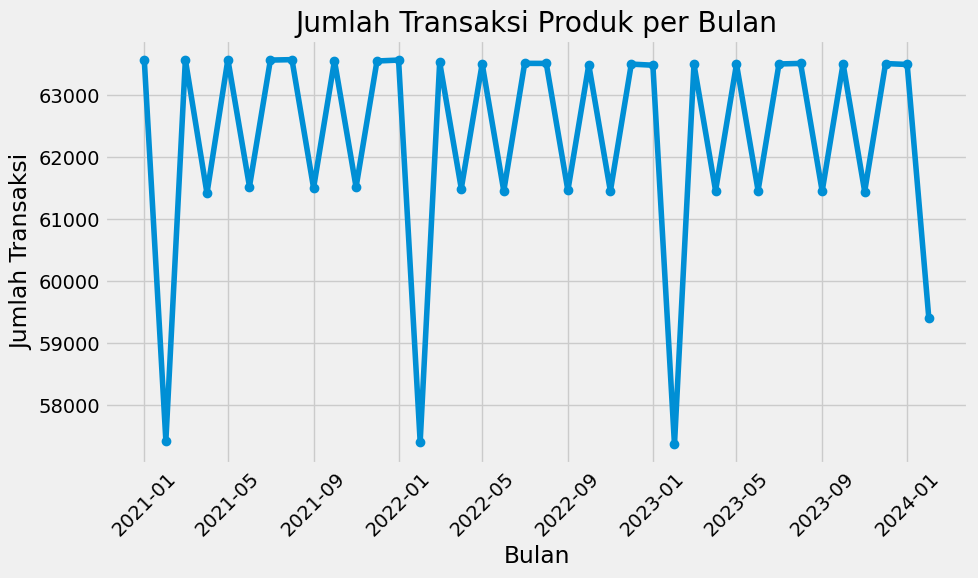

In [ ]:
# Mengonversi tanggal menjadi periode bulanan
df1['bulan'] = df1['tanggal'].dt.to_period('M')

# Hitung jumlah transaksi per bulan
transaksi_per_bulan = df1['bulan'].value_counts().sort_index()

# Konversi 'bulan' kembali ke datetime untuk plotting
transaksi_per_bulan.index = transaksi_per_bulan.index.to_timestamp()

# Tampilkan data
print(transaksi_per_bulan)

# Plot data menggunakan line chart
plt.figure(figsize=(10, 6))
plt.plot(transaksi_per_bulan.index, transaksi_per_bulan.values, marker='o')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Transaksi')
plt.title('Jumlah Transaksi Produk per Bulan')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Jumlah Penjualan Perminggu

In [ ]:
# Menambahkan kolom 'minggu' berdasarkan 'tanggal'
df1['minggu'] = df1['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)

# Menghitung pendapatan (jumlah total dari harga_pound) per minggu
pendapatan_per_minggu = df1.groupby('minggu')['harga_pound'].sum().reset_index()

# Mengubah nama kolom untuk kejelasan
pendapatan_per_minggu.columns = ['minggu', 'pendapatan_total']

# Menyimpan hasil ke file CSV baru
pendapatan_per_minggu.to_csv('pendapatan_per_minggu.csv', index=False)

print(pendapatan_per_minggu)

        minggu  pendapatan_total
0   2020-12-28          31328.74
1   2021-01-04          56107.77
2   2021-01-11          70550.31
3   2021-01-18          90095.97
4   2021-01-25          62066.83
..         ...               ...
161 2024-01-29          80673.95
162 2024-02-05          77542.20
163 2024-02-12          66277.71
164 2024-02-19          72094.21
165 2024-02-26          48985.64

[166 rows x 2 columns]


<ipython-input-76-70e3efb251db>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['minggu'] = df1['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)


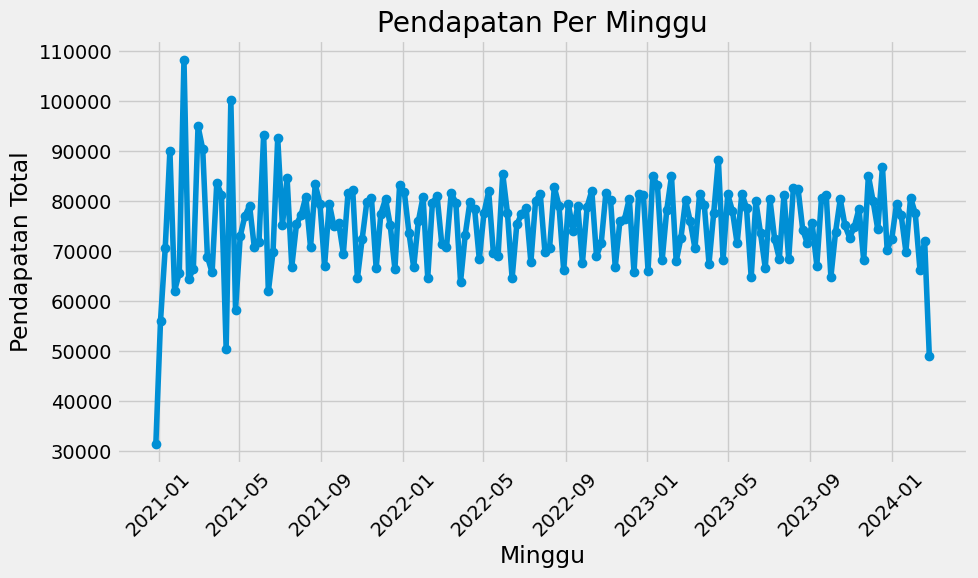

In [ ]:
# Plot data menggunakan line chart
plt.figure(figsize=(10, 6))
plt.plot(pendapatan_per_minggu['minggu'], pendapatan_per_minggu['pendapatan_total'], marker='o')
plt.title('Pendapatan Per Minggu')
plt.xlabel('Minggu')
plt.ylabel('Pendapatan Total')
plt.grid(True)
plt.xticks(rotation=45)

# Menampilkan chart
plt.tight_layout()
plt.show()

#### UKMart

<ipython-input-78-eca736c868a6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UK['minggu'] = UK['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)


        minggu  pendapatan_total
0   2020-12-28           9181.28
1   2021-01-04          36770.97
2   2021-01-11          40671.41
3   2021-01-18          70363.93
4   2021-01-25          41787.87
..         ...               ...
161 2024-01-29          45134.95
162 2024-02-05          44339.03
163 2024-02-12          45478.04
164 2024-02-19          46034.95
165 2024-02-26          26466.03

[166 rows x 2 columns]


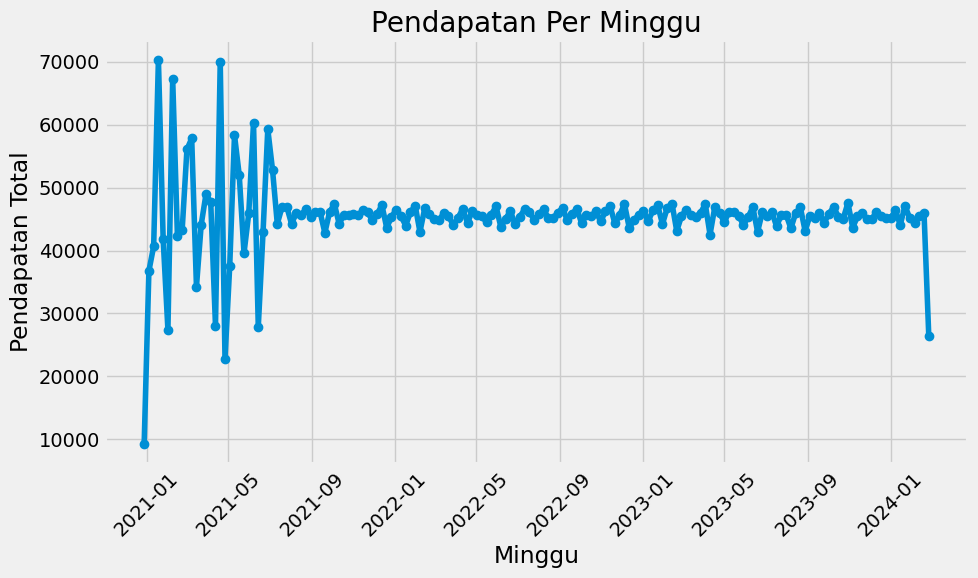

In [ ]:
# Melihat penjualan per week dari UKMart
# Menambahkan kolom 'minggu' berdasarkan 'tanggal'
UK['minggu'] = UK['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)

# Menghitung pendapatan (jumlah total dari harga_pound) per minggu
pendapatan_UK = UK.groupby('minggu')['harga_pound'].sum().reset_index()

# Mengubah nama kolom untuk kejelasan
pendapatan_UK.columns = ['minggu', 'pendapatan_total']

print(pendapatan_UK)

# Plot data menggunakan line chart
plt.figure(figsize=(10, 6))
plt.plot(pendapatan_UK['minggu'], pendapatan_UK['pendapatan_total'], marker='o')
plt.title('Pendapatan Per Minggu')
plt.xlabel('Minggu')
plt.ylabel('Pendapatan Total')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### BritishMart

<ipython-input-79-38dabce4b888>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BRITISH['minggu'] = BRITISH['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)


        minggu  pendapatan_total
0   2020-12-28          22147.46
1   2021-01-04          19336.80
2   2021-01-11          29878.90
3   2021-01-18          19732.04
4   2021-01-25          20278.96
..         ...               ...
161 2024-01-29          35539.00
162 2024-02-05          33203.17
163 2024-02-12          20799.67
164 2024-02-19          26059.26
165 2024-02-26          22519.61

[166 rows x 2 columns]


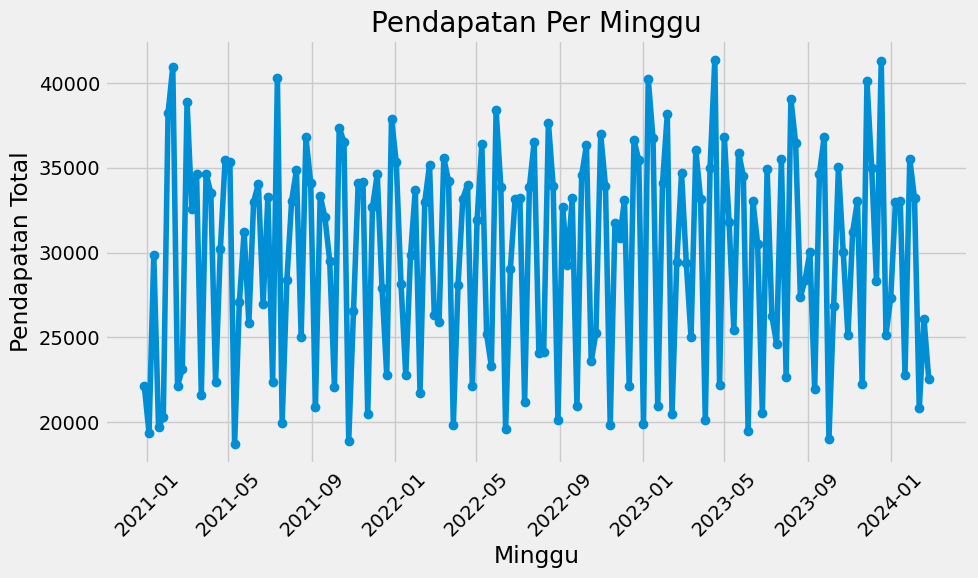

In [ ]:
# Melihat penjualan per week dari BritishMart
# Menambahkan kolom 'minggu' berdasarkan 'tanggal'
BRITISH['minggu'] = BRITISH['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)

# Menghitung pendapatan (jumlah total dari harga_pound) per minggu
pendapatan_british = BRITISH.groupby('minggu')['harga_pound'].sum().reset_index()

# Mengubah nama kolom untuk kejelasan
pendapatan_british.columns = ['minggu', 'pendapatan_total']

print(pendapatan_british)

# Plot data menggunakan line chart
plt.figure(figsize=(10, 6))
plt.plot(pendapatan_british['minggu'], pendapatan_british['pendapatan_total'], marker='o')
plt.title('Pendapatan Per Minggu')
plt.xlabel('Minggu')
plt.ylabel('Pendapatan Total')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# melihat fitur baru week
Fitur.head()

,date,day_of_week,month,year
0,2021-01-01,Friday,January,2021
1,2021-01-01,Friday,January,2021
2,2021-01-01,Friday,January,2021
3,2021-01-01,Friday,January,2021
4,2021-01-01,Friday,January,2021


### Mengkategorikan harga per unit (Mahal, Sedang, Murah)

In [ ]:
# Kategori harga per unit
def price_per_unit_category(row):
    if row['harga_per_unit'] < 1:
        return 'Murah'
    elif 1 <= row['harga_pound'] <= 3:
        return 'Sedang'
    else:
        return 'Mahal'

Fitur['harga_per_unit_kategori'] = df1.apply(price_per_unit_category, axis=1)
Fitur

,date,day_of_week,month,year,harga_per_unit_kategori
0,2021-01-01,Friday,January,2021,Sedang
1,2021-01-01,Friday,January,2021,Sedang
2,2021-01-01,Friday,January,2021,Murah
3,2021-01-01,Friday,January,2021,Sedang
4,2021-01-01,Friday,January,2021,Murah
...,...,...,...,...,...
1387639,2022-04-30,Saturday,April,2022,Sedang
1387640,2022-05-01,Sunday,May,2022,Sedang
1387641,2022-05-02,Monday,May,2022,Sedang
1387642,2022-05-03,Tuesday,May,2022,Sedang


###  Menghitung harga rata-rata per bulan dan kategori

<ipython-input-82-1363043f45d5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['month'] = pd.to_datetime(df1['tanggal']).dt.month_name()


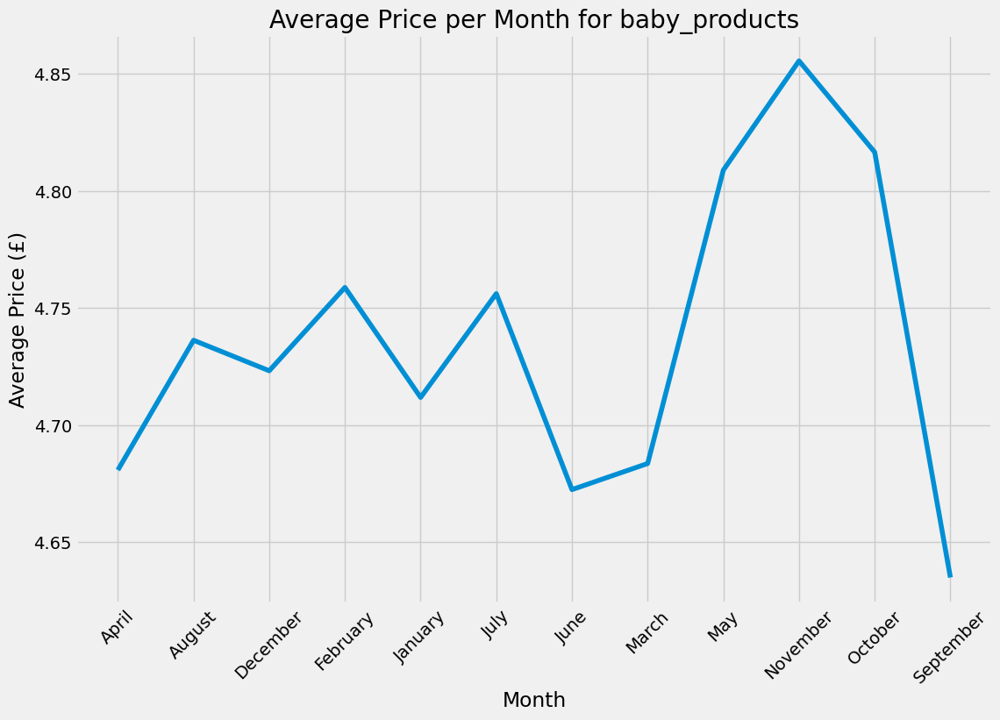

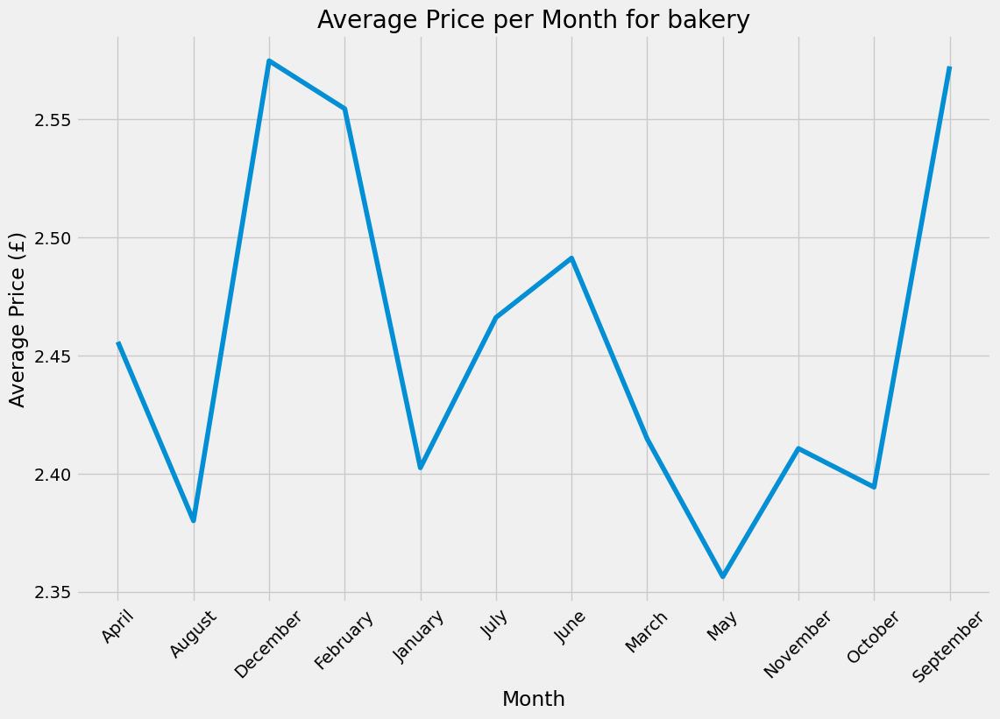

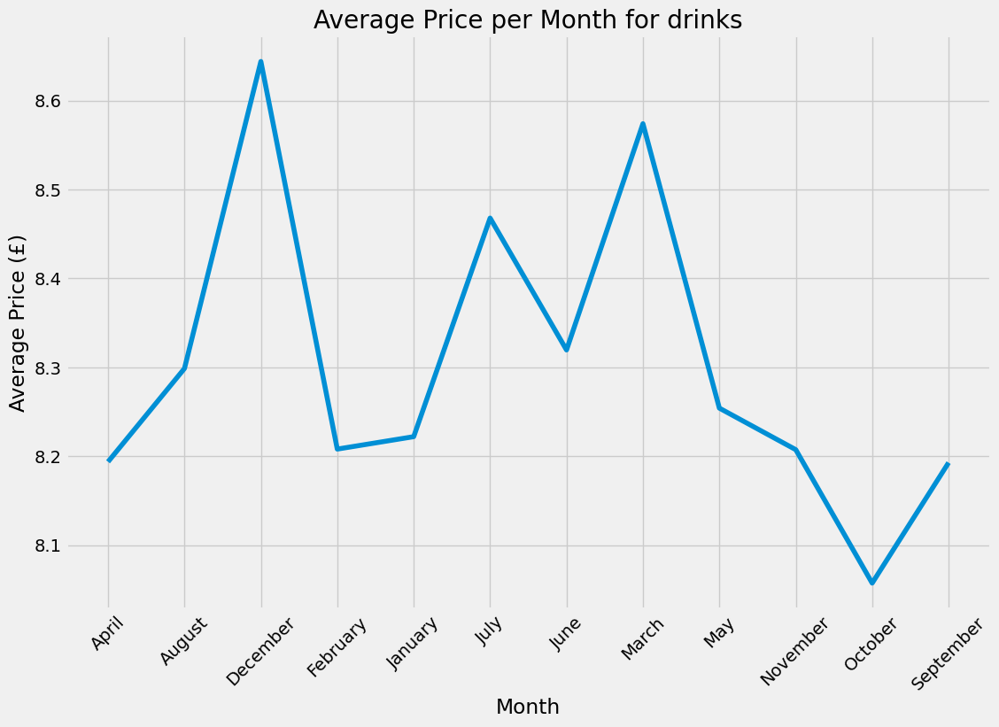

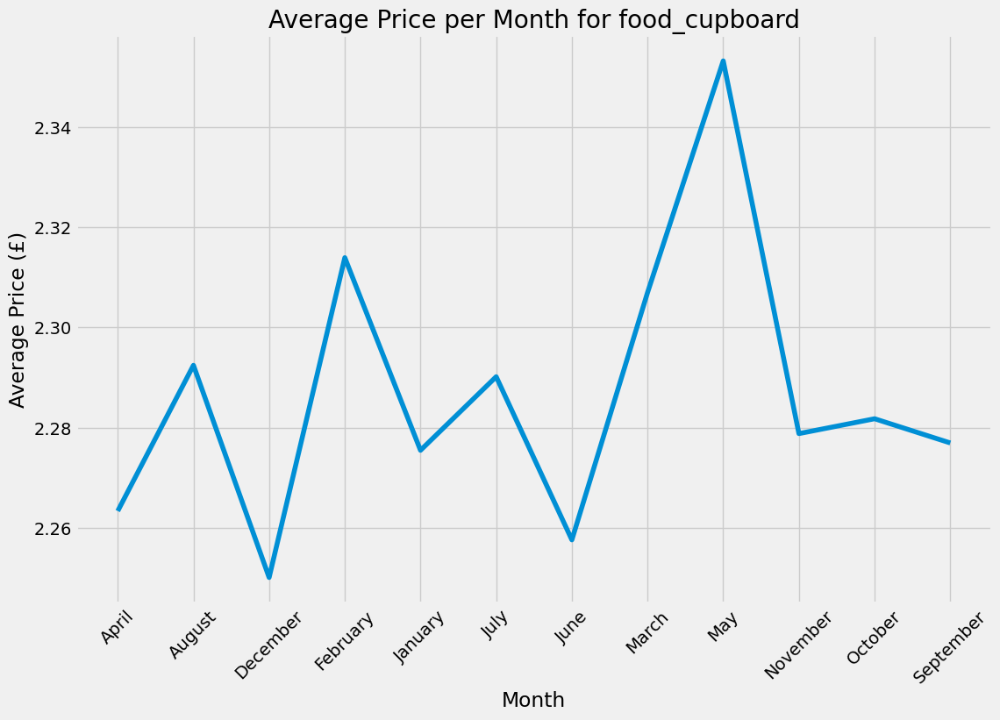

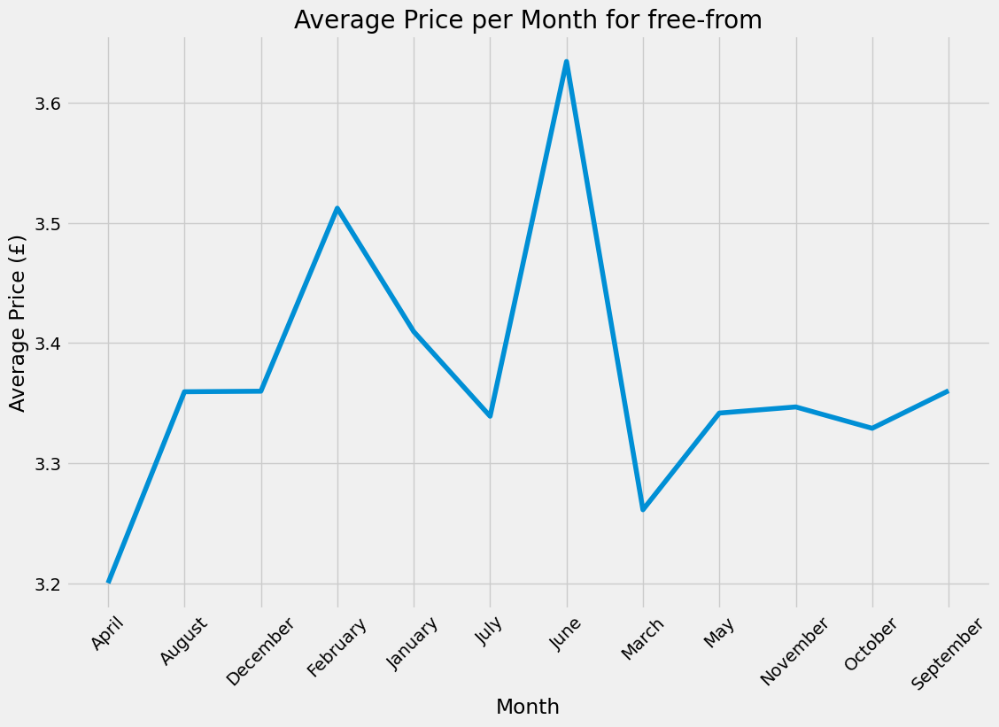

...

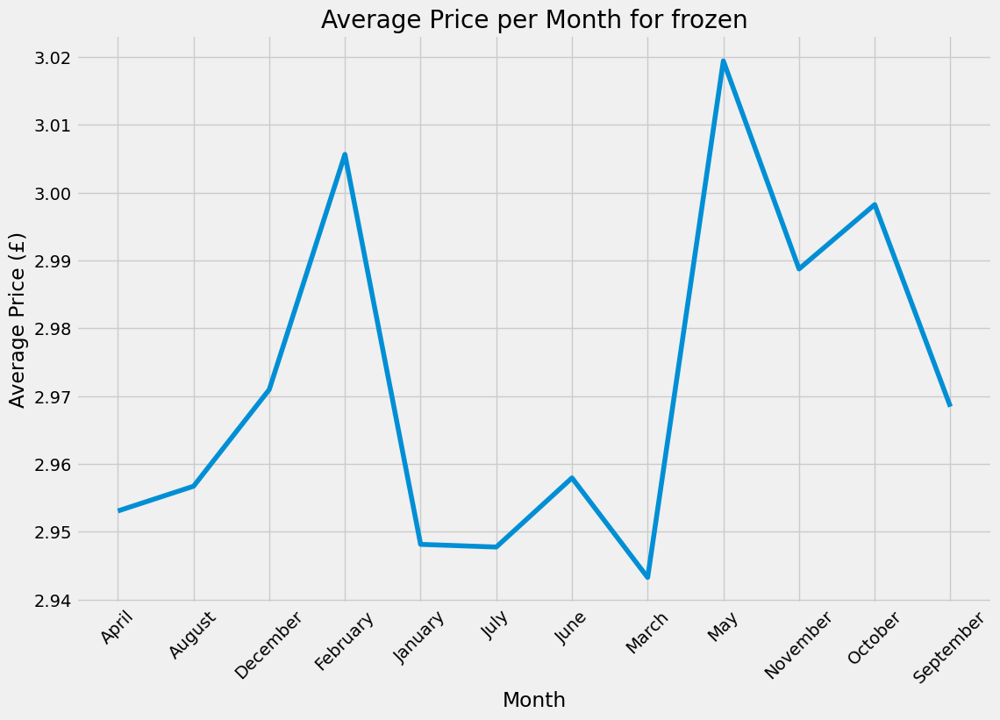

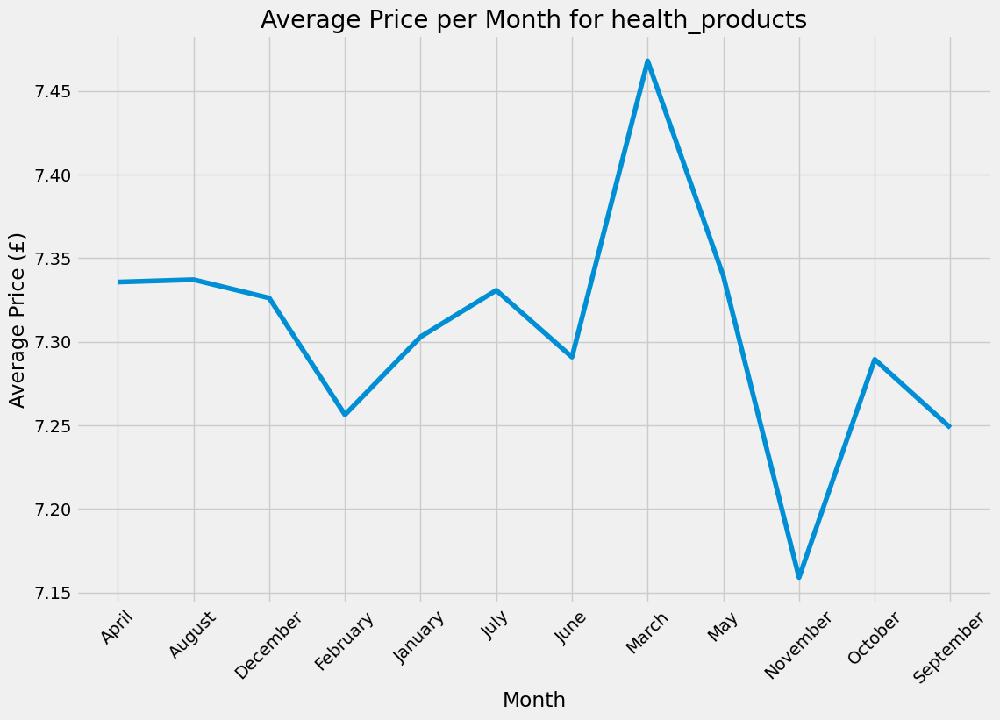

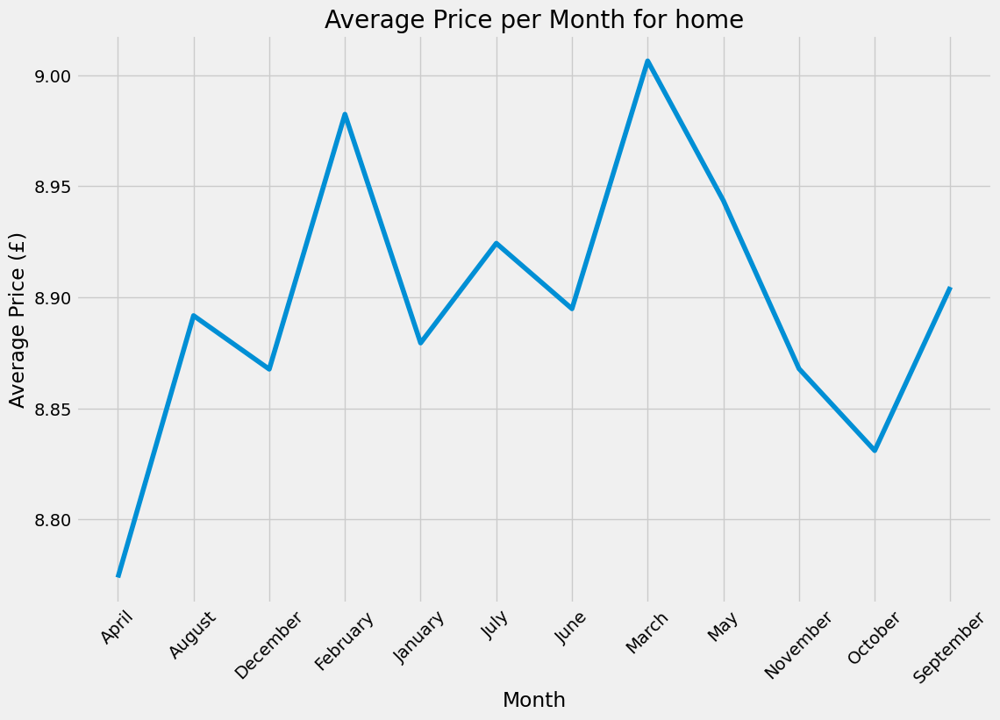

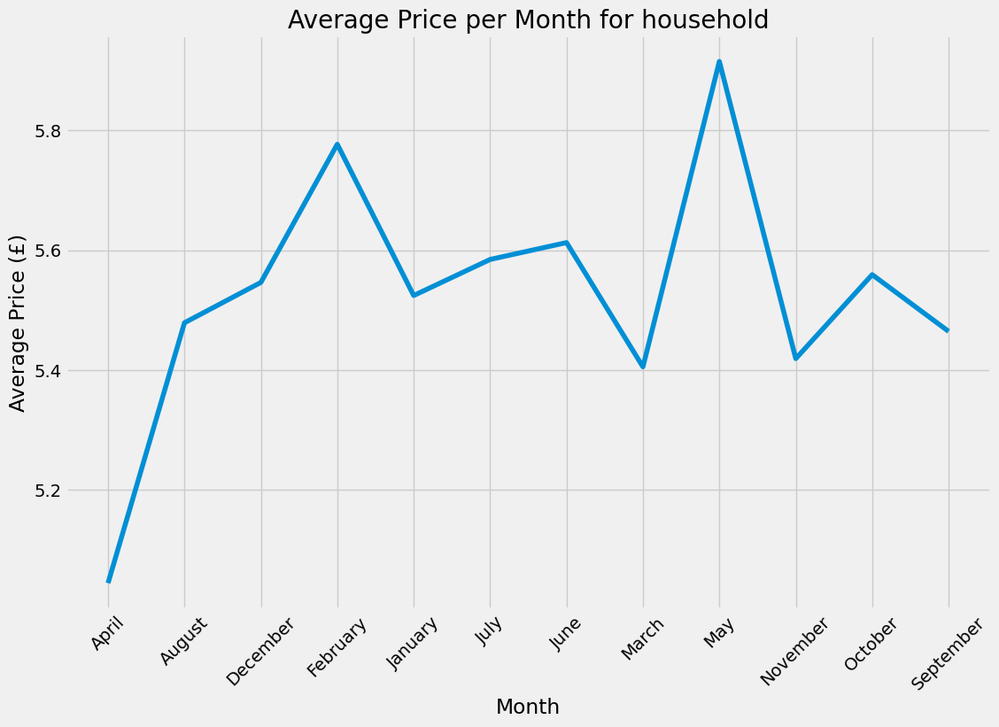

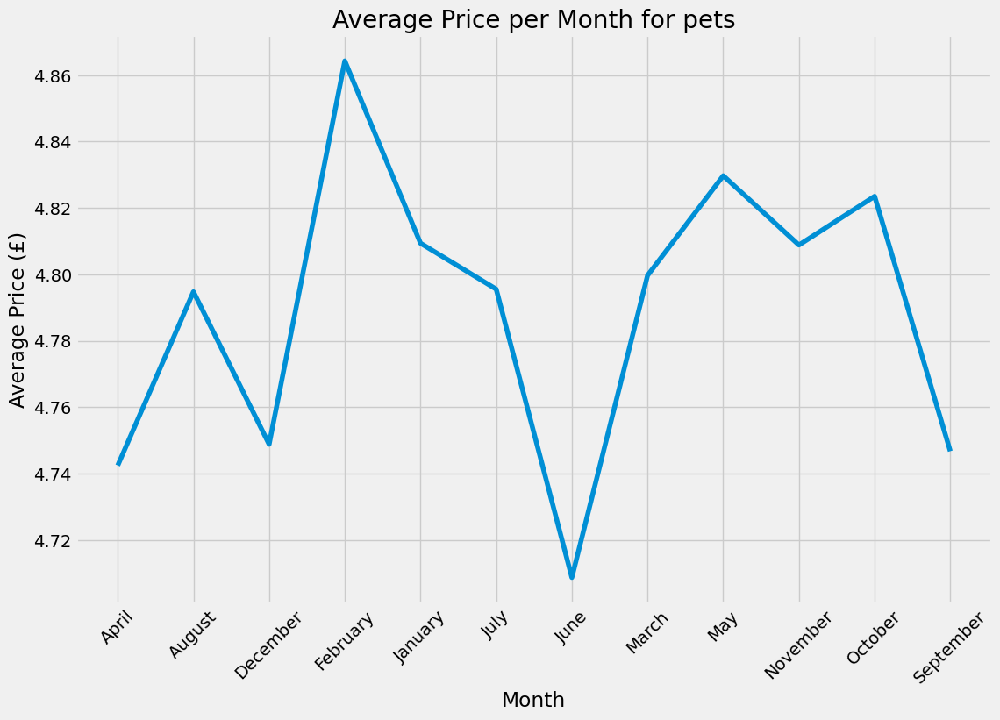

In [ ]:
# Menghitung harga rata-rata per bulan dan kategori
df1['month'] = pd.to_datetime(df1['tanggal']).dt.month_name()
data_avg_price_per_month = df1.groupby(['kategori', 'month'])['harga_pound'].mean().reset_index()

# Memvisualisasikan tren musiman
for category in data_avg_price_per_month['kategori'].unique():
    plt.figure(figsize=(12, 8))  # Menentukan ukuran gambar, misalnya 12x8 inci
    plt.plot(data_avg_price_per_month[data_avg_price_per_month['kategori'] == category]['month'],
             data_avg_price_per_month[data_avg_price_per_month['kategori'] == category]['harga_pound'])

    plt.title(f'Average Price per Month for {category}')
    plt.xlabel('Month')
    plt.ylabel('Average Price (£)')
    plt.xticks(rotation=45)  # Memutar label sumbu-x agar lebih mudah dibaca
    plt.grid(True)  # Menambahkan grid untuk mempermudah interpretasi data
    plt.show()
    print()

### Menghitung harga rata-rata per minggu dan kategori

<ipython-input-83-9255020a4fad>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['week'] = pd.to_datetime(df1['tanggal']).dt.to_period('W')


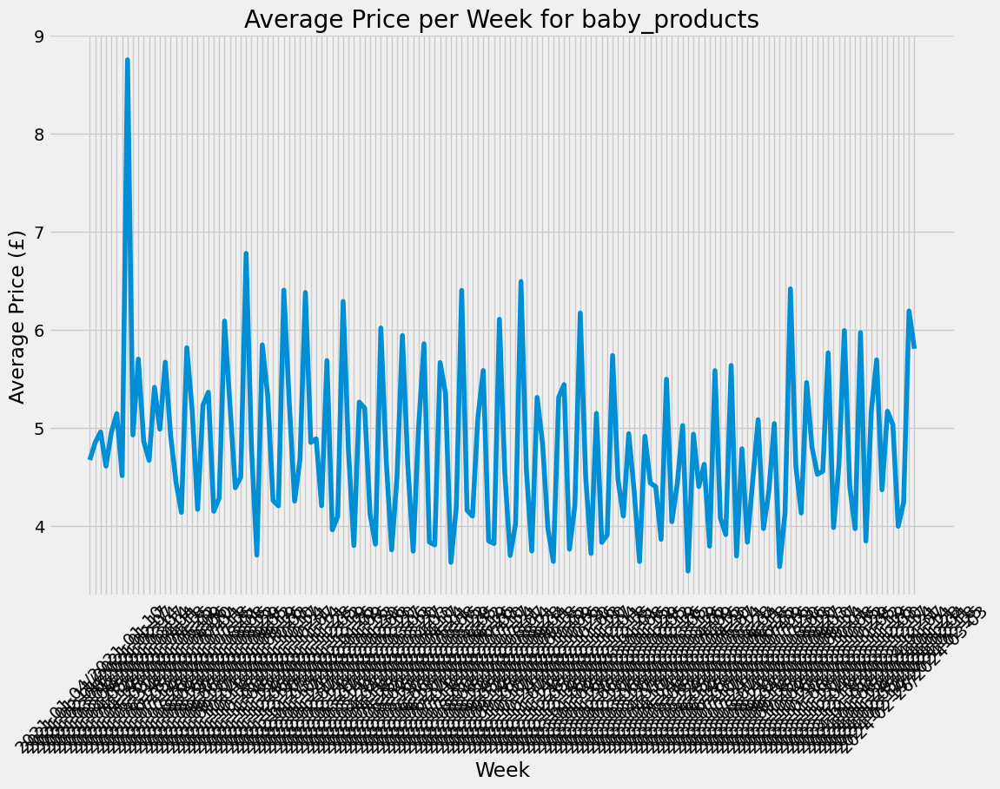

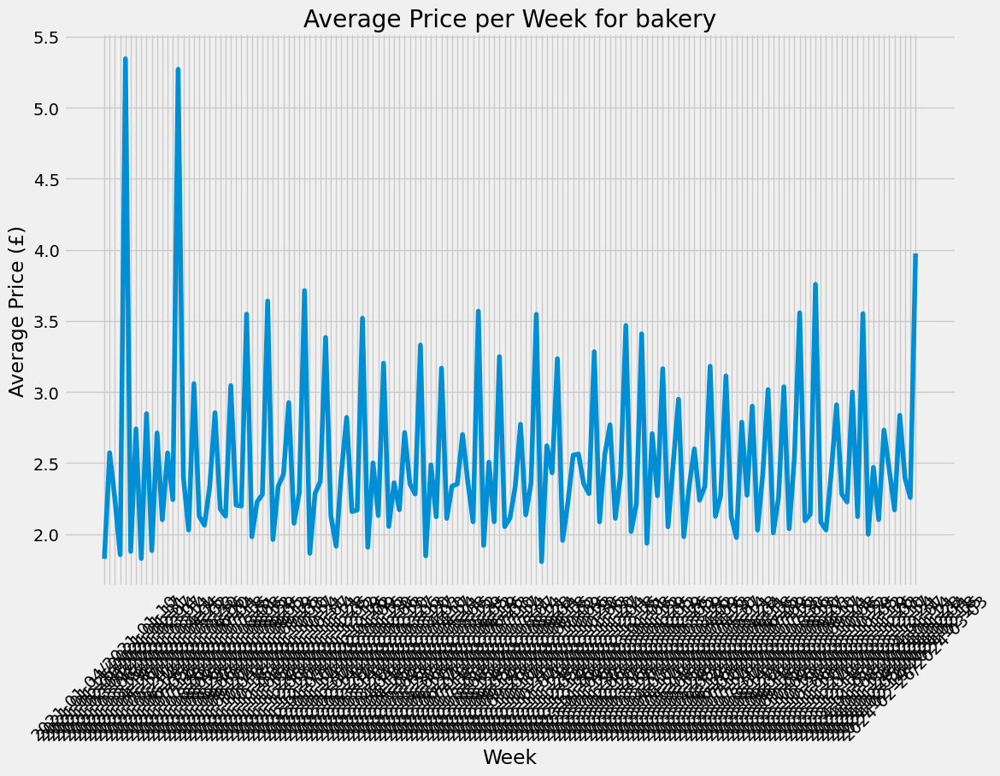

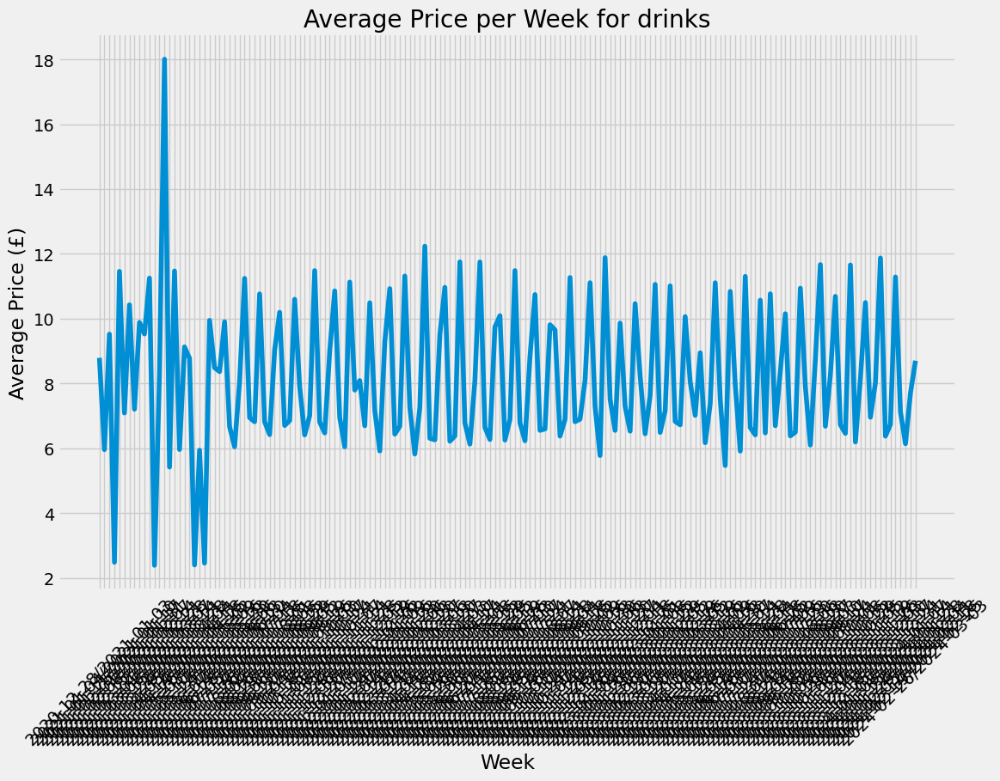

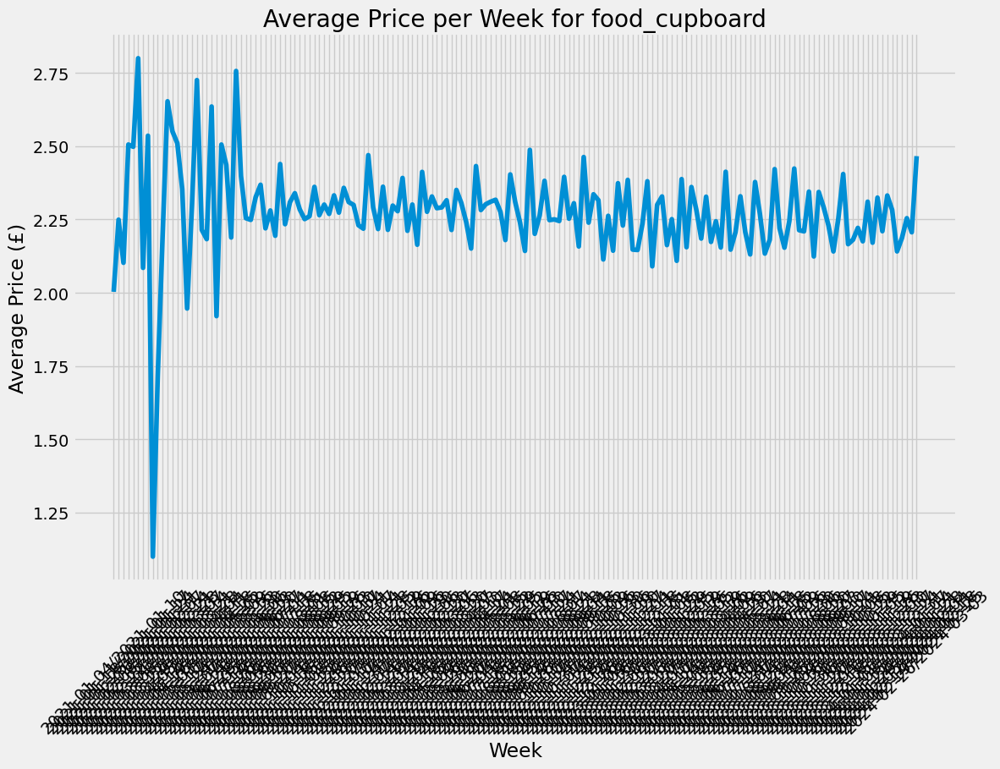

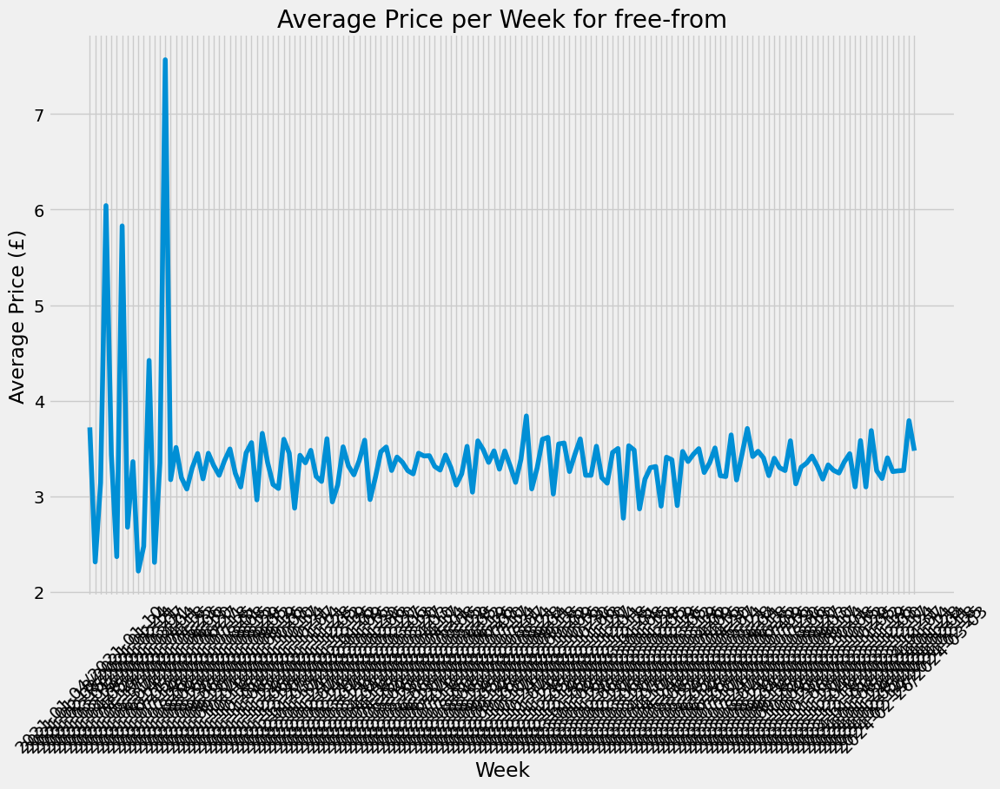

...

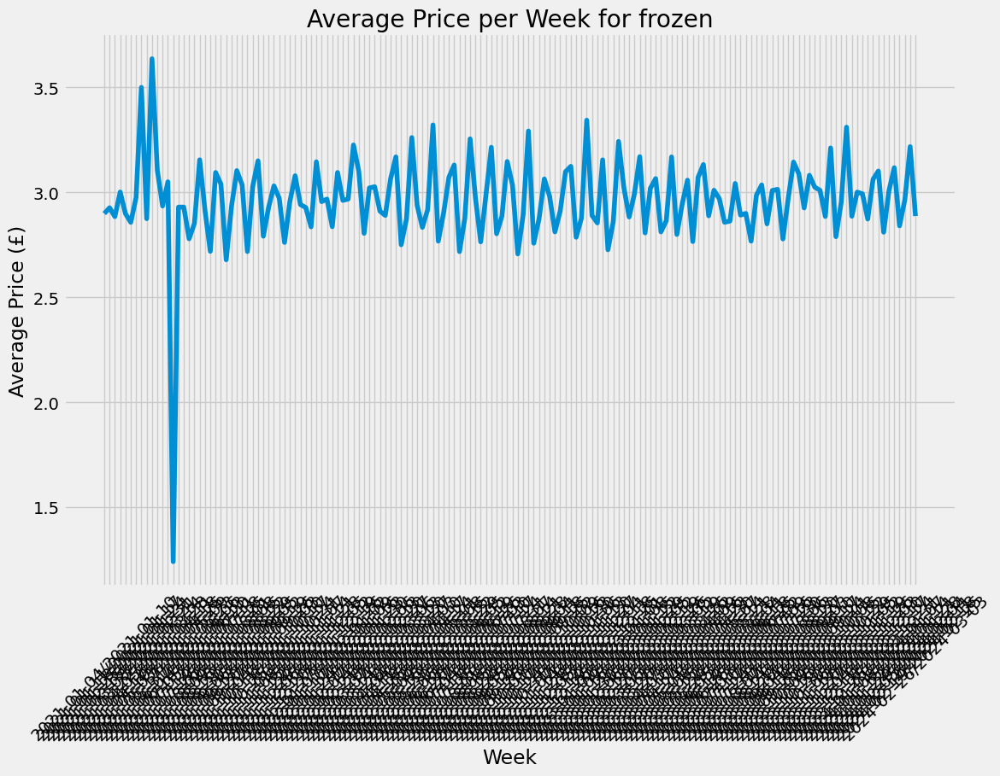

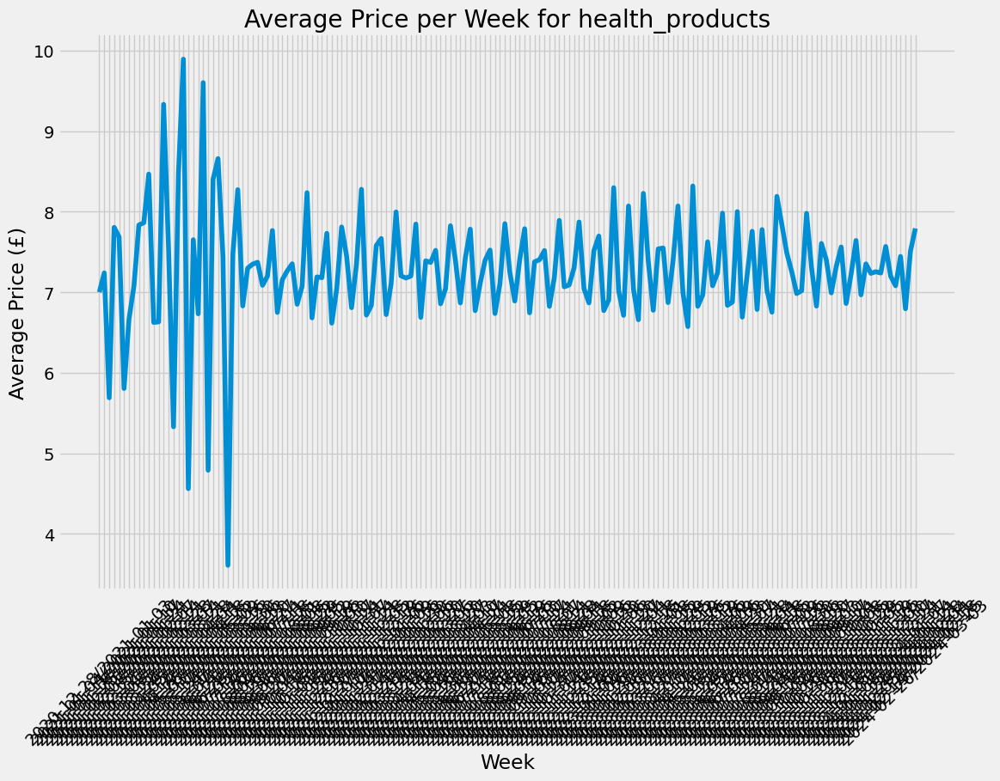

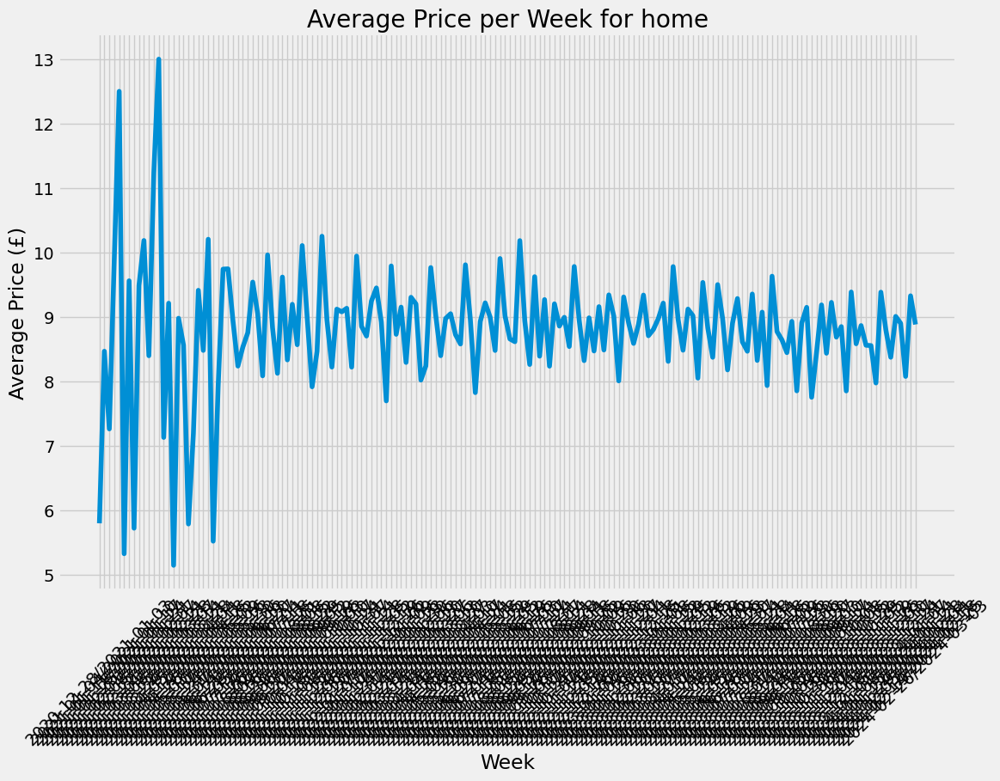

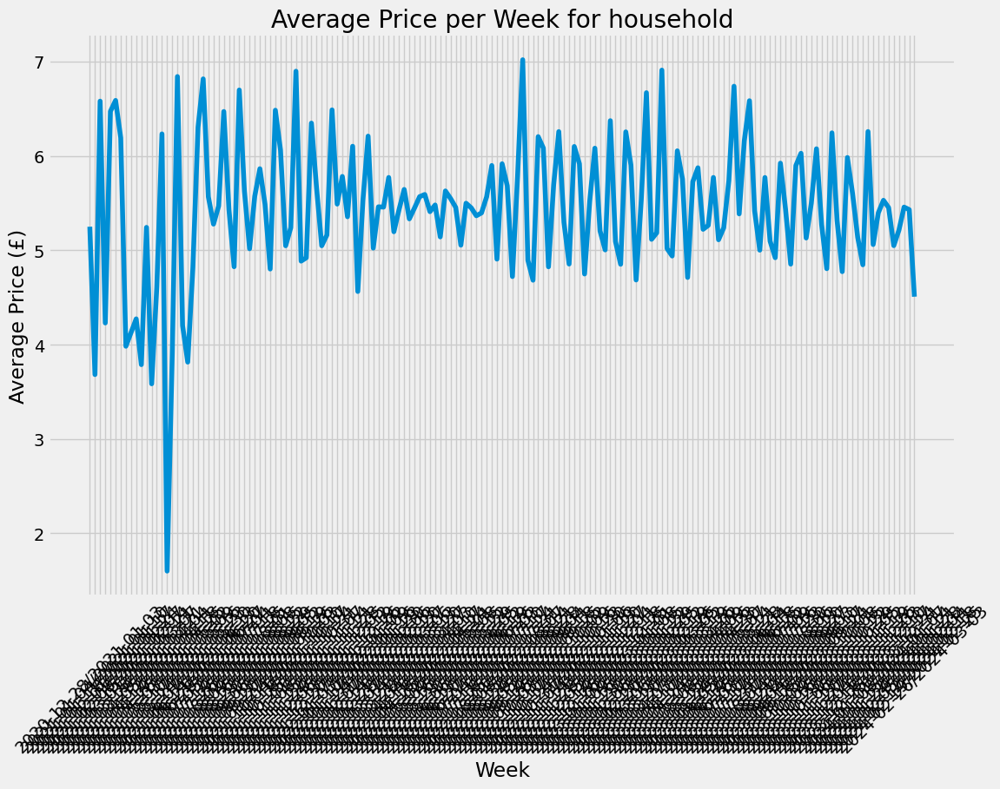

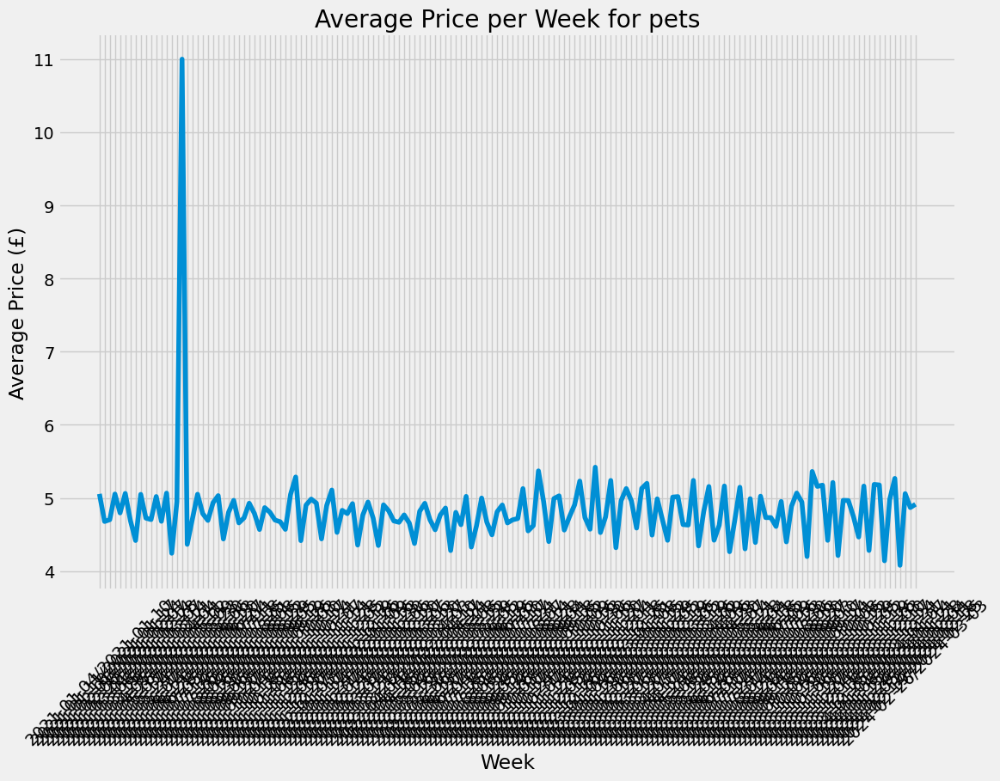

In [ ]:
# Menghitung harga rata-rata per minggu dan kategori
df1['week'] = pd.to_datetime(df1['tanggal']).dt.to_period('W')
data_avg_price_per_week = df1.groupby(['kategori', 'week'])['harga_pound'].mean().reset_index()

# Konversi 'week' menjadi string agar dapat di-plot
data_avg_price_per_week['week_str'] = data_avg_price_per_week['week'].astype(str)

# Memvisualisasikan tren musiman
for category in data_avg_price_per_week['kategori'].unique():
    plt.figure(figsize=(12, 8))  # Menentukan ukuran gambar, misalnya 12x8 inci
    plt.plot(data_avg_price_per_week[data_avg_price_per_week['kategori'] == category]['week_str'],
             data_avg_price_per_week[data_avg_price_per_week['kategori'] == category]['harga_pound'])

    plt.title(f'Average Price per Week for {category}')
    plt.xlabel('Week')
    plt.ylabel('Average Price (£)')
    plt.xticks(rotation=45)  # Memutar label sumbu-x agar lebih mudah dibaca
    plt.grid(True)  # Menambahkan grid untuk mempermudah interpretasi data
    plt.show()
    print()

# **MACHINE LEARNING**

## LINIER REGRESSION

### UKMart

In [ ]:
df2 = UK.drop(['nama_toko','harga_per_unit','unit','nama','kategori','brand_sendiri'],axis=1)

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1387088 entries, 0 to 1387643
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype         
---  ------       --------------    -----         
 0   harga_pound  1387088 non-null  float64       
 1   tanggal      1387088 non-null  datetime64[ns]
 2   minggu       1387088 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(1)
memory usage: 42.3 MB


In [ ]:
df2['tanggal'] = df2['tanggal'].dt.to_period("W")
week_sales1 = df2.groupby('tanggal').sum().reset_index()

In [ ]:
week_sales1['tanggal'] = week_sales1['tanggal'].dt.to_timestamp()

In [ ]:
week_sales1.head(10)

,tanggal,harga_pound
0,2020-12-28,9181.28
1,2021-01-04,36770.97
2,2021-01-11,40671.41
3,2021-01-18,70363.93
4,2021-01-25,41787.87
5,2021-02-01,27386.09
6,2021-02-08,67330.64
7,2021-02-15,42253.94
8,2021-02-22,43340.96
9,2021-03-01,56082.35


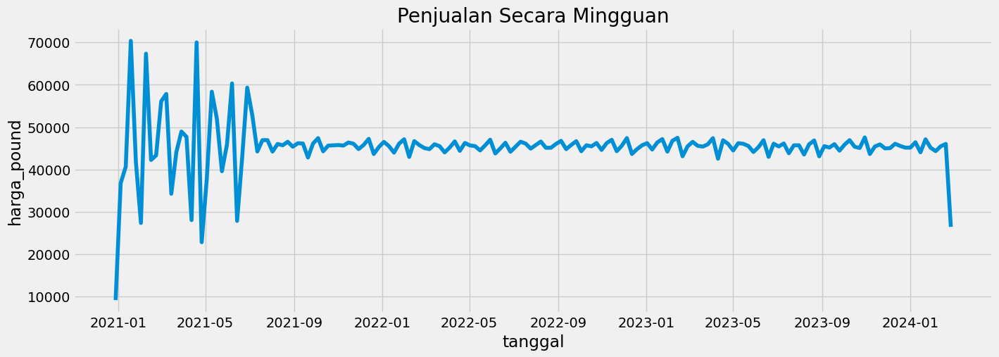

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(week_sales1['tanggal'],week_sales1['harga_pound'])
plt.xlabel('tanggal')
plt.ylabel('harga_pound')
plt.title('Penjualan Secara Mingguan')
plt.show()

**PREPOCESSING**

In [ ]:
week_sales1['sales_diff'] = week_sales1['harga_pound'].diff()
week_sales1 = week_sales1.dropna()
week_sales1.head(10)

,tanggal,harga_pound,sales_diff
1,2021-01-04,36770.97,27589.69
2,2021-01-11,40671.41,3900.44
3,2021-01-18,70363.93,29692.52
4,2021-01-25,41787.87,-28576.06
5,2021-02-01,27386.09,-14401.78
6,2021-02-08,67330.64,39944.55
7,2021-02-15,42253.94,-25076.70
8,2021-02-22,43340.96,1087.02
9,2021-03-01,56082.35,12741.39
10,2021-03-08,57829.53,1747.18


drop off sales and date

In [ ]:
supervised_data1 = week_sales1.drop(['tanggal','harga_pound'], axis=1)

Preparing supervised data

In [ ]:
for i in range (1,49):
  col_name = 'week_' + str(i)
  supervised_data1[col_name] = supervised_data1['sales_diff'].shift(i)
supervised_data1 = supervised_data1.dropna().reset_index(drop=True)
supervised_data1.head(10)

,sales_diff,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,...,week_39,week_40,week_41,week_42,week_43,week_44,week_45,week_46,week_47,week_48
0,980.16,-1254.62,-300.88,730.08,-129.11,69.52,65.46,1343.30,-3105.28,1271.97,...,1747.18,12741.39,1087.02,-25076.70,39944.55,-14401.78,-28576.06,29692.52,3900.44,27589.69
1,1426.99,980.16,-1254.62,-300.88,730.08,-129.11,69.52,65.46,1343.30,-3105.28,...,-23554.32,1747.18,12741.39,1087.02,-25076.70,39944.55,-14401.78,-28576.06,29692.52,3900.44
2,-3580.83,1426.99,980.16,-1254.62,-300.88,730.08,-129.11,69.52,65.46,1343.30,...,9849.06,-23554.32,1747.18,12741.39,1087.02,-25076.70,39944.55,-14401.78,-28576.06,29692.52
3,1652.65,-3580.83,1426.99,980.16,-1254.62,-300.88,730.08,-129.11,69.52,65.46,...,4835.86,9849.06,-23554.32,1747.18,12741.39,1087.02,-25076.70,39944.55,-14401.78,-28576.06
4,1223.21,1652.65,-3580.83,1426.99,980.16,-1254.62,-300.88,730.08,-129.11,69.52,...,-1250.43,4835.86,9849.06,-23554.32,1747.18,12741.39,1087.02,-25076.70,39944.55,-14401.78
5,-1020.40,1223.21,1652.65,-3580.83,1426.99,980.16,-1254.62,-300.88,730.08,-129.11,...,-19651.57,-1250.43,4835.86,9849.06,-23554.32,1747.18,12741.39,1087.02,-25076.70,39944.55
6,-1519.06,-1020.40,1223.21,1652.65,-3580.83,1426.99,980.16,-1254.62,-300.88,730.08,...,41930.98,-19651.57,-1250.43,4835.86,9849.06,-23554.32,1747.18,12741.39,1087.02,-25076.70
7,2119.96,-1519.06,-1020.40,1223.21,1652.65,-3580.83,1426.99,980.16,-1254.62,-300.88,...,-47150.43,41930.98,-19651.57,-1250.43,4835.86,9849.06,-23554.32,1747.18,12741.39,1087.02
8,1031.56,2119.96,-1519.06,-1020.40,1223.21,1652.65,-3580.83,1426.99,980.16,-1254.62,...,14774.22,-47150.43,41930.98,-19651.57,-1250.43,4835.86,9849.06,-23554.32,1747.18,12741.39
9,-4164.32,1031.56,2119.96,-1519.06,-1020.40,1223.21,1652.65,-3580.83,1426.99,980.16,...,20751.63,14774.22,-47150.43,41930.98,-19651.57,-1250.43,4835.86,9849.06,-23554.32,1747.18


Split data into train and test

In [ ]:
train_data1 = supervised_data1[:-48]
test_data1 = supervised_data1[-48:]
print('Train Data Shape:', train_data1.shape)
print('Test Data Shape:', test_data1.shape)

Train Data Shape: (69, 49)
Test Data Shape: (48, 49)


In [ ]:
scaler1 = MinMaxScaler(feature_range=(-1,1))
scaler1.fit(train_data1)
train_data1 = scaler1.transform(train_data1)
test_data1 = scaler1.transform(test_data1)

In [ ]:
X_train1, y_train1 = train_data1[:,1:], train_data1[:,0:1]
X_test1, y_test1 = test_data1[:,1:], test_data1[:,0:1]
y_train1 = y_train1.ravel()
y_test1 = y_test1.ravel()
print('X_train1 Shape: ', X_train1.shape)
print('y_train1 Shape: ', y_train1.shape)
print('X_test1 Shape: ', X_test1.shape)
print('y_test1 Shape: ', y_test1.shape)

X_train1 Shape:  (69, 48)
y_train1 Shape:  (69,)
X_test1 Shape:  (48, 48)
y_test1 Shape:  (48,)


In [ ]:
sales_dates1 = week_sales1['tanggal'][-48:].reset_index(drop=True)
predict_df1 = pd.DataFrame(sales_dates1)

In [ ]:
act_sales1 = week_sales1['harga_pound'][-48:].to_list()
act_sales1

[47391.85,
 42546.78,
 46896.63,
 46046.54,
 44490.52,
 46210.27,
 46068.53,
 45553.62,
 44134.94,
 45285.81,
 46915.22,
 42984.77,
 46091.16,
 45436.84,
 46152.22,
 43840.05,
 45707.34,
 45719.15,
 43531.03,
 45946.09,
 46854.79,
 43115.15,
 45507.9,
 45181.36,
 45976.41,
 44448.18,
 45851.63,
 46924.52,
 45363.51,
 45079.67,
 47568.18,
 43647.77,
 45431.6,
 45920.44,
 44984.09,
 45044.94,
 46073.25,
 45550.2,
 45157.64,
 45163.37,
 46421.91,
 44064.98,
 47128.44,
 45134.95,
 44339.03,
 45478.04,
 46034.95,
 26466.03]

In [ ]:
lr_model1 = LinearRegression()
lr_model1.fit(X_train1, y_train1)
lr_pre1 = lr_model1.predict(X_test1)

In [ ]:
lr_pre1 = lr_pre1.reshape(-1,1)

lr_pre_test_set1 = np.concatenate([lr_pre1, X_test1], axis=1)
lr_pre_test_set1 = scaler1.inverse_transform(lr_pre_test_set1)

In [ ]:
# Buat daftar hasil prediksi
result_list1 = []
for index in range(0, len(lr_pre_test_set1)):
    result_list1.append(lr_pre_test_set1[index][0] + act_sales1[index])

# Buat Series dari hasil prediksi
lr_pre_series1 = pd.Series(result_list1, name="Prediction Sales")

# Gabungkan hasil prediksi dengan dataframe predict_df
predict_df1 = predict_df1.merge(lr_pre_series1, left_index=True, right_index=True)

# Cetak dataframe untuk memeriksa hasil
print(predict_df1)


      tanggal  Prediction Sales
0  2023-04-03      47727.327657
1  2023-04-10      40460.849602
2  2023-04-17      50244.094464
3  2023-04-24      46609.844767
4  2023-05-01      41889.684341
5  2023-05-08      48031.241477
6  2023-05-15      45972.105200
7  2023-05-22      45210.966815
8  2023-05-29      44742.117739
9  2023-06-05      46669.551509
10 2023-06-12      48846.498411
11 2023-06-19      39623.848433
12 2023-06-26      48761.221890
13 2023-07-03      45567.861837
14 2023-07-10      45432.787854
15 2023-07-17      43564.810285
16 2023-07-24      47175.593609
17 2023-07-31      47289.325820
18 2023-08-07      41399.194760
19 2023-08-14      48061.224623
20 2023-08-21      47435.015083
21 2023-08-28      39749.767933
22 2023-09-04      47871.540635
23 2023-09-11      45269.549423
24 2023-09-18      46873.514685
25 2023-09-25      41738.464648
26 2023-10-02      47194.155166
27 2023-10-09      46655.809968
28 2023-10-16      42394.821158
29 2023-10-23      45135.563041
30 2023-

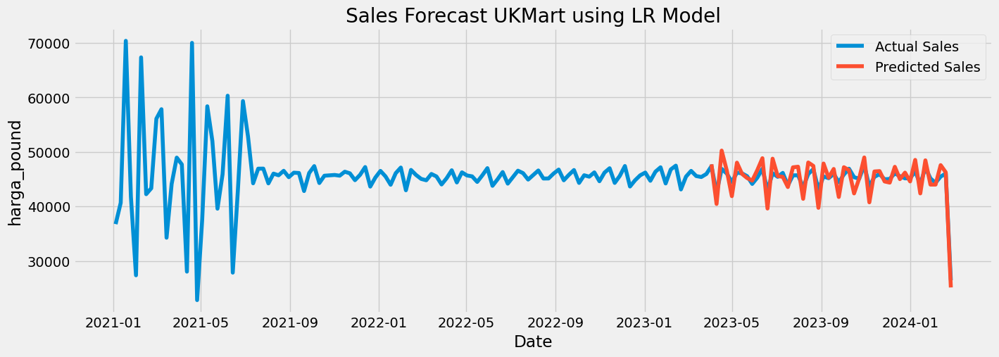

In [ ]:
plt.figure(figsize=(15,5))
# Actual Sales
plt.plot(week_sales1['tanggal'],week_sales1['harga_pound'])
#Predicted Sales
plt.plot(predict_df1['tanggal'],predict_df1['Prediction Sales'])
plt.title('Sales Forecast UKMart using LR Model')
plt.xlabel('Date')
plt.ylabel('harga_pound')
plt.legend(['Actual Sales', 'Predicted Sales'])
plt.show()

In [ ]:
df_rl1 = pd.DataFrame(act_sales1, columns=['Actual Sales'])

predict_df1 = pd.concat([predict_df1, df_rl1], axis=1)
predict_df1

,tanggal,Prediction Sales,Actual Sales
0,2023-04-03,47727.327657,47391.85
1,2023-04-10,40460.849602,42546.78
2,2023-04-17,50244.094464,46896.63
3,2023-04-24,46609.844767,46046.54
4,2023-05-01,41889.684341,44490.52
5,2023-05-08,48031.241477,46210.27
6,2023-05-15,45972.105200,46068.53
7,2023-05-22,45210.966815,45553.62
8,2023-05-29,44742.117739,44134.94
9,2023-06-05,46669.551509,45285.81


#### Model Evaluation

In [ ]:
# skala normal
lr_mse1 = np.sqrt(mean_squared_error(predict_df1['Prediction Sales'],week_sales1['harga_pound'][-48:]))
lr_mae1 = mean_absolute_error(predict_df1['Prediction Sales'],week_sales1['harga_pound'][-48:])
lr_r21 = r2_score(predict_df1['Prediction Sales'],week_sales1['harga_pound'][-48:])
print('Linear Regression MSE: ', lr_mse1)
print('Linear Regression MAE: ', lr_mae1)
print('Linear Regression R2: ', lr_r21)

Linear Regression MSE:  1664.1260543648366
Linear Regression MAE:  1347.1646999677077
Linear Regression R2:  0.8164015140270555


In [ ]:
# skala scaling
lr_mses1 = np.sqrt(mean_squared_error(lr_pre1,y_test1))
lr_maes1 = mean_absolute_error(lr_pre1,y_test1)
lr_r2s1 = r2_score(lr_pre1,y_test1)
print('Linear Regression MSE: ', lr_mses1)
print('Linear Regression MAE: ', lr_maes1)
print('Linear Regression R2: ',lr_r2s1)

Linear Regression MSE:  0.6946928102566158
Linear Regression MAE:  0.2779717056449445
Linear Regression R2:  -1.855213524546028


### BritishMart

In [ ]:
df3 = BRITISH.drop(['nama_toko','harga_per_unit','unit','nama','kategori','brand_sendiri'],axis=1)

In [ ]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 979848 entries, 0 to 979865
Data columns (total 3 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   harga_pound  979848 non-null  float64       
 1   tanggal      979848 non-null  datetime64[ns]
 2   minggu       979848 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(1)
memory usage: 29.9 MB


In [ ]:
df3['tanggal'] = df3['tanggal'].dt.to_period("W")
week_sales2 = df3.groupby('tanggal').sum().reset_index()

In [ ]:
week_sales2['tanggal'] = week_sales2['tanggal'].dt.to_timestamp()

In [ ]:
week_sales2.head(10)

,tanggal,harga_pound
0,2020-12-28,22147.46
1,2021-01-04,19336.80
2,2021-01-11,29878.90
3,2021-01-18,19732.04
4,2021-01-25,20278.96
5,2021-02-01,38227.71
6,2021-02-08,40967.30
7,2021-02-15,22141.19
8,2021-02-22,23119.41
9,2021-03-01,38891.93


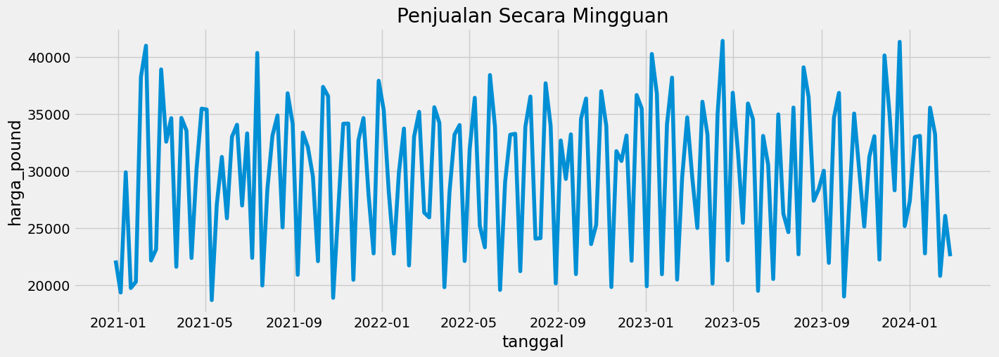

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(week_sales2['tanggal'],week_sales2['harga_pound'])
plt.xlabel('tanggal')
plt.ylabel('harga_pound')
plt.title('Penjualan Secara Mingguan')
plt.show()

**PREPOCESSING**

In [ ]:
week_sales2['sales_diff'] = week_sales2['harga_pound'].diff()
week_sales2 = week_sales2.dropna()
week_sales2.head(10)

,tanggal,harga_pound,sales_diff
1,2021-01-04,19336.80,-2810.66
2,2021-01-11,29878.90,10542.10
3,2021-01-18,19732.04,-10146.86
4,2021-01-25,20278.96,546.92
5,2021-02-01,38227.71,17948.75
6,2021-02-08,40967.30,2739.59
7,2021-02-15,22141.19,-18826.11
8,2021-02-22,23119.41,978.22
9,2021-03-01,38891.93,15772.52
10,2021-03-08,32553.61,-6338.32


drop off sales and date

In [ ]:
supervised_data2 = week_sales2.drop(['tanggal','harga_pound'], axis=1)

Preparing supervised data

In [ ]:
for i in range (1,49):
  col_name1 = 'week_' + str(i)
  supervised_data2[col_name1] = supervised_data2['sales_diff'].shift(i)
supervised_data2 = supervised_data2.dropna().reset_index(drop=True)
supervised_data2.head(10)

,sales_diff,week_1,week_2,week_3,week_4,week_5,week_6,week_7,week_8,week_9,...,week_39,week_40,week_41,week_42,week_43,week_44,week_45,week_46,week_47,week_48
0,1946.98,12228.51,-13698.44,20.32,7571.90,7681.70,-17669.99,-819.73,15280.01,-7427.57,...,-6338.32,15772.52,978.22,-18826.11,2739.59,17948.75,546.92,-10146.86,10542.10,-2810.66
1,-6702.56,1946.98,12228.51,-13698.44,20.32,7571.90,7681.70,-17669.99,-819.73,15280.01,...,2066.09,-6338.32,15772.52,978.22,-18826.11,2739.59,17948.75,546.92,-10146.86,10542.10
2,-5160.08,-6702.56,1946.98,12228.51,-13698.44,20.32,7571.90,7681.70,-17669.99,-819.73,...,-13026.98,2066.09,-6338.32,15772.52,978.22,-18826.11,2739.59,17948.75,546.92,-10146.86
3,15132.82,-5160.08,-6702.56,1946.98,12228.51,-13698.44,20.32,7571.90,7681.70,-17669.99,...,13049.24,-13026.98,2066.09,-6338.32,15772.52,978.22,-18826.11,2739.59,17948.75,546.92
4,-2573.40,15132.82,-5160.08,-6702.56,1946.98,12228.51,-13698.44,20.32,7571.90,7681.70,...,-1110.31,13049.24,-13026.98,2066.09,-6338.32,15772.52,978.22,-18826.11,2739.59,17948.75
5,-7177.33,-2573.40,15132.82,-5160.08,-6702.56,1946.98,12228.51,-13698.44,20.32,7571.90,...,-11169.82,-1110.31,13049.24,-13026.98,2066.09,-6338.32,15772.52,978.22,-18826.11,2739.59
6,-5396.12,-7177.33,-2573.40,15132.82,-5160.08,-6702.56,1946.98,12228.51,-13698.44,20.32,...,7824.62,-11169.82,-1110.31,13049.24,-13026.98,2066.09,-6338.32,15772.52,978.22,-18826.11
7,7101.37,-5396.12,-7177.33,-2573.40,15132.82,-5160.08,-6702.56,1946.98,12228.51,-13698.44,...,5269.06,7824.62,-11169.82,-1110.31,13049.24,-13026.98,2066.09,-6338.32,15772.52,978.22
8,3857.90,7101.37,-5396.12,-7177.33,-2573.40,15132.82,-5160.08,-6702.56,1946.98,12228.51,...,-77.59,5269.06,7824.62,-11169.82,-1110.31,13049.24,-13026.98,2066.09,-6338.32,15772.52
9,-11998.38,3857.90,7101.37,-5396.12,-7177.33,-2573.40,15132.82,-5160.08,-6702.56,1946.98,...,-16702.83,-77.59,5269.06,7824.62,-11169.82,-1110.31,13049.24,-13026.98,2066.09,-6338.32


Split data into train and test

In [ ]:
train_data2 = supervised_data2[:-48]
test_data2 = supervised_data2[-48:]
print('Train Data Shape:', train_data2.shape)
print('Test Data Shape:', test_data2.shape)

Train Data Shape: (69, 49)
Test Data Shape: (48, 49)


In [ ]:
scaler2 = MinMaxScaler(feature_range=(-1,1))
scaler2.fit(train_data2)
train_data2 = scaler2.transform(train_data2)
test_data2 = scaler2.transform(test_data2)

In [ ]:
X_train2, y_train2 = train_data2[:,1:], train_data2[:,0:1]
X_test2, y_test2 = test_data2[:,1:], test_data2[:,0:1]
y_train2 = y_train2.ravel()
y_test2 = y_test2.ravel()
print('X_train2 Shape: ', X_train2.shape)
print('y_train2 Shape: ', y_train2.shape)
print('X_test2 Shape: ', X_test2.shape)
print('y_test2 Shape: ', y_test2.shape)

X_train2 Shape:  (69, 48)
y_train2 Shape:  (69,)
X_test2 Shape:  (48, 48)
y_test2 Shape:  (48,)


In [ ]:
sales_dates2 = week_sales2['tanggal'][-48:].reset_index(drop=True)
predict_df2 = pd.DataFrame(sales_dates2)

In [ ]:
act_sales2 = week_sales2['harga_pound'][-48:].to_list()
act_sales2

[20119.02,
 34997.37,
 41394.78,
 22160.57,
 36846.55,
 31799.9,
 25447.97,
 35907.340000000004,
 34525.1,
 19485.81,
 33067.0,
 30536.91,
 20522.31,
 34950.71,
 26254.26,
 24627.19,
 35547.62,
 22685.85,
 39074.77,
 36465.38,
 27381.01,
 28410.23,
 30014.01,
 21934.98,
 34647.85,
 36834.68,
 18987.88,
 26876.66,
 35026.26,
 30050.86,
 25114.17,
 31233.62,
 33039.25,
 22225.55,
 40118.25,
 34979.16,
 28295.53,
 41308.86,
 25154.76,
 27348.54,
 32967.95,
 33068.8,
 22767.44,
 35539.0,
 33203.17,
 20799.670000000002,
 26059.26,
 22519.61]

In [ ]:
lr_model2 = LinearRegression()
lr_model2.fit(X_train2, y_train2)
lr_pre2 = lr_model2.predict(X_test2)

In [ ]:
lr_pre2 = lr_pre2.reshape(-1,1)

lr_pre_test_set2 = np.concatenate([lr_pre2, X_test2], axis=1)
lr_pre_test_set2 = scaler2.inverse_transform(lr_pre_test_set2)

In [ ]:
# Buat daftar hasil prediksi
result_list2 = []
for index in range(0, len(lr_pre_test_set2)):
    result_list2.append(lr_pre_test_set2[index][0] + act_sales2[index])

# Buat Series dari hasil prediksi
lr_pre_series2 = pd.Series(result_list2, name="Prediction Sales")

# Gabungkan hasil prediksi dengan dataframe predict_df
predict_df2 = predict_df2.merge(lr_pre_series2, left_index=True, right_index=True)

# Cetak dataframe untuk memeriksa hasil
print(predict_df2)


      tanggal  Prediction Sales
0  2023-04-03      10528.202661
1  2023-04-10      55458.958640
2  2023-04-17      43557.676910
3  2023-04-24      -2007.271079
4  2023-05-01      43954.770170
5  2023-05-08      34235.786199
6  2023-05-15      10194.816638
7  2023-05-22      51802.317964
8  2023-05-29      31215.658325
9  2023-06-05       7187.723503
10 2023-06-12      51911.949417
11 2023-06-19      39784.063319
12 2023-06-26      10311.694130
13 2023-07-03      51954.799878
14 2023-07-10      29589.787295
15 2023-07-17      29203.170186
16 2023-07-24      37679.725614
17 2023-07-31      26087.463746
18 2023-08-07      41605.034904
19 2023-08-14      29709.305625
20 2023-08-21      14989.589989
21 2023-08-28      32262.623797
22 2023-09-04      25570.675029
23 2023-09-11      36952.427056
24 2023-09-18      42476.780235
25 2023-09-25      32972.921128
26 2023-10-02       8348.873487
27 2023-10-09      30392.418800
28 2023-10-16      40272.006838
29 2023-10-23      36935.453615
30 2023-

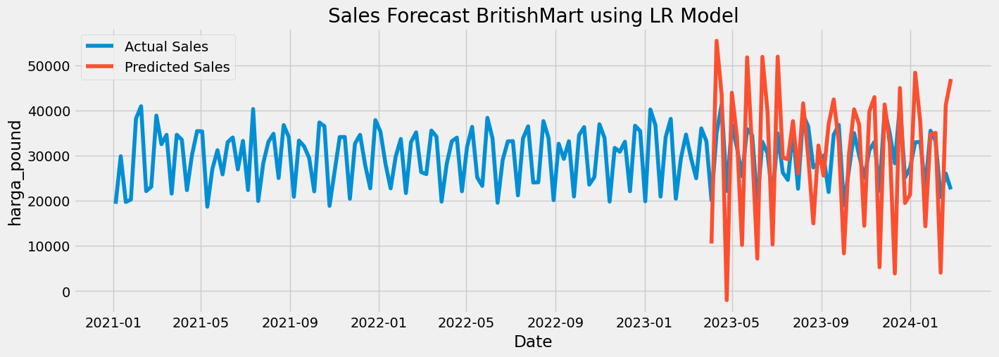

In [ ]:
plt.figure(figsize=(15,5))
# Actual Sales
plt.plot(week_sales2['tanggal'],week_sales2['harga_pound'])
#Predicted Sales
plt.plot(predict_df2['tanggal'],predict_df2['Prediction Sales'])
plt.title('Sales Forecast BritishMart using LR Model')
plt.xlabel('Date')
plt.ylabel('harga_pound')
plt.legend(['Actual Sales', 'Predicted Sales'])
plt.show()

In [ ]:
df_rl2= pd.DataFrame(act_sales2, columns=['Actual Sales'])

predict_df2 = pd.concat([predict_df2, df_rl2], axis=1)
predict_df2

,tanggal,Prediction Sales,Actual Sales
0,2023-04-03,10528.202661,20119.02
1,2023-04-10,55458.958640,34997.37
2,2023-04-17,43557.676910,41394.78
3,2023-04-24,-2007.271079,22160.57
4,2023-05-01,43954.770170,36846.55
5,2023-05-08,34235.786199,31799.90
6,2023-05-15,10194.816638,25447.97
7,2023-05-22,51802.317964,35907.34
8,2023-05-29,31215.658325,34525.10
9,2023-06-05,7187.723503,19485.81


#### Model Evaluation

In [ ]:
# skala normal
lr_mse2 = np.sqrt(mean_squared_error(predict_df2['Prediction Sales'],week_sales2['harga_pound'][-48:]))
lr_mae2 = mean_absolute_error(predict_df2['Prediction Sales'],week_sales2['harga_pound'][-48:])
lr_r22 = r2_score(predict_df2['Prediction Sales'],week_sales2['harga_pound'][-48:])
print('Linear Regression MSE: ', lr_mse2)
print('Linear Regression MAE: ', lr_mae2)
print('Linear Regression R2: ', lr_r22)

Linear Regression MSE:  11297.172197063868
Linear Regression MAE:  9189.213887261518
Linear Regression R2:  0.42675353162983587


In [ ]:
# skala scaling
lr_mses2 = np.sqrt(mean_squared_error(lr_pre2,y_test2))
lr_maes2 = mean_absolute_error(lr_pre2,y_test2)
lr_r2s2 = r2_score(lr_pre2,y_test2)
print('Linear Regression MSE: ', lr_mses2)
print('Linear Regression MAE: ', lr_maes2)
print('Linear Regression R2: ',lr_r2s2)

Linear Regression MSE:  0.4988087096712574
Linear Regression MAE:  0.40470886773256515
Linear Regression R2:  0.2917940974194133


## ARIMA

In [ ]:
def test_stationarity(timeseries):
    #Determing rolling statistics
    MA = timeseries.rolling(window=12).mean()
    MSTD = timeseries.rolling(window=12).std()

    #Plot rolling statistics:
    plt.figure(figsize=(15,5))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(MA, color='red', label='Rolling Mean')
    std = plt.plot(MSTD, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

   #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

In [ ]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

### UKMart

In [ ]:
# Menambahkan kolom 'minggu' berdasarkan 'tanggal'
UK['minggu'] = UK['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)

# Menghitung pendapatan (jumlah total dari harga_pound) per minggu
pendapatan_per_minggu1 = UK.groupby('minggu')['harga_pound'].sum().reset_index()

# Mengubah nama kolom untuk kejelasan
pendapatan_per_minggu1.columns = ['minggu', 'pendapatan_total']

# Menyimpan hasil ke file CSV baru
pendapatan_per_minggu1.to_csv('pendapatan_per_minggu.csv', index=False)

print(pendapatan_per_minggu1)

        minggu  pendapatan_total
0   2020-12-28           9181.28
1   2021-01-04          36770.97
2   2021-01-11          40671.41
3   2021-01-18          70363.93
4   2021-01-25          41787.87
..         ...               ...
161 2024-01-29          45134.95
162 2024-02-05          44339.03
163 2024-02-12          45478.04
164 2024-02-19          46034.95
165 2024-02-26          26466.03

[166 rows x 2 columns]


<ipython-input-128-84e86c37b643>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  UK['minggu'] = UK['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)


In [ ]:
import plotly.express as px
figure1 = px.line(pendapatan_per_minggu1, x='minggu', y='pendapatan_total', title='Pendapatan Perjualan Kuartal')
figure1.show()

<Figure size 640x480 with 0 Axes>

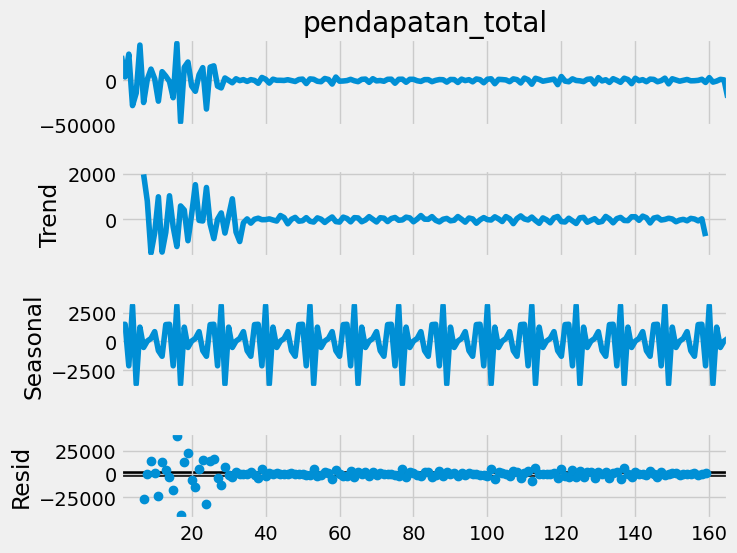

In [ ]:
import statsmodels.api as sm
pendapatan_per_minggu1_diff = pendapatan_per_minggu1.pendapatan_total.diff()
pendapatan_per_minggu1_diff = pendapatan_per_minggu1_diff.dropna()

dec1 = sm.tsa.seasonal_decompose(pendapatan_per_minggu1_diff,period = 12)
fig = plt.figure()
fig = dec1.plot()
fig.set_size_inches(8, 6)


In [ ]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result1 = adfuller(pendapatan_per_minggu1.pendapatan_total.dropna())
print('ADF Statistic: %f' % result1[0])
print('p-value: %f' % result1[1])

ADF Statistic: -4.144702
p-value: 0.000816


Dengan ADF Statistic sebesar -4.144702 dan p-value 0.000816, kita dapat menyimpulkan bahwa time series yang diuji tidak memiliki unit root dan merupakan stasioner. Ini berarti bahwa sifat statistik dari time series (seperti rata-rata dan varians) tidak berubah seiring waktu.








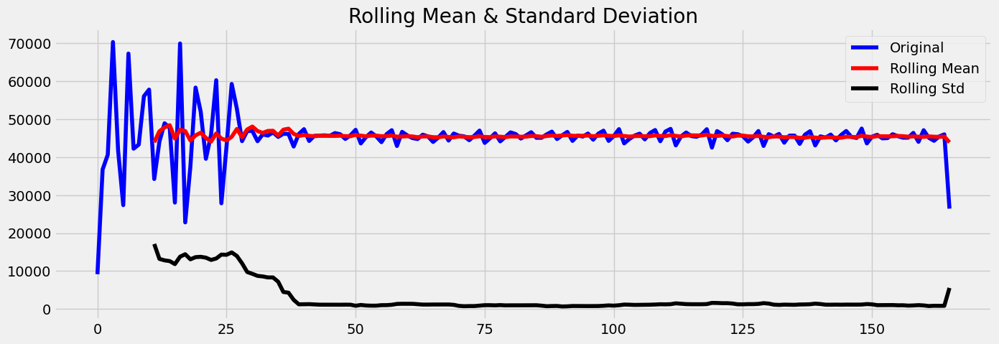

Results of Dickey-Fuller Test:
Test Statistic                  -4.144702
p-value                          0.000816
#Lags Used                      13.000000
Number of Observations Used    152.000000
Critical Value (1%)             -3.474121
Critical Value (5%)             -2.880750
Critical Value (10%)            -2.577013
dtype: float64


In [ ]:
test_stationarity(pendapatan_per_minggu1['pendapatan_total'])

* Test Statistic (-4.144702) lebih kecil (lebih negatif) dari semua critical values pada tingkat signifikansi 1%, 5%, dan 10%.
* p-value (0.000816) jauh di bawah 0.05.

Ini menunjukkan bahwa kita dapat menolak hipotesis nol dengan keyakinan yang sangat tinggi, menyimpulkan bahwa time series yang diuji tidak memiliki unit root dan merupakan stasioner.

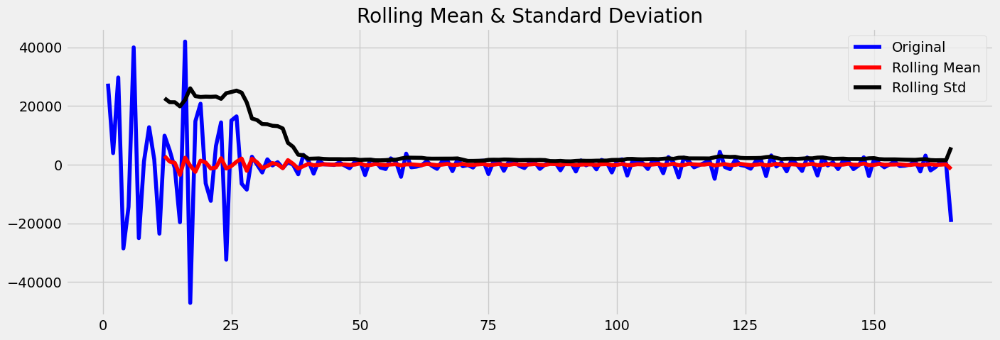

Results of Dickey-Fuller Test:
Test Statistic                -6.657115e+00
p-value                        4.952135e-09
#Lags Used                     1.100000e+01
Number of Observations Used    1.530000e+02
Critical Value (1%)           -3.473830e+00
Critical Value (5%)           -2.880623e+00
Critical Value (10%)          -2.576945e+00
dtype: float64


In [ ]:
test_stationarity(timeseries=pendapatan_per_minggu1_diff)

* Test Statistic (-6.657115) lebih kecil (lebih negatif) daripada semua critical values pada tingkat signifikansi 1%, 5%, dan 10%.
* p-value (4.952135e-09) jauh di bawah 0.05, yang menunjukkan hasil yang sangat signifikan.

Ini berarti bahwa kita dapat menolak hipotesis nol dengan keyakinan yang sangat tinggi, menyimpulkan bahwa time series yang diuji tidak memiliki unit root dan merupakan stasioner.

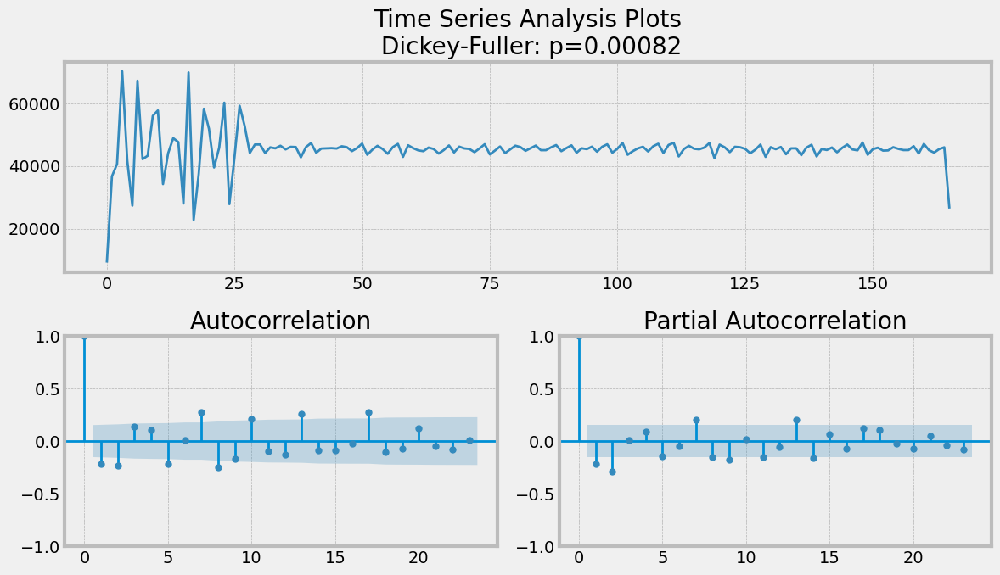

In [ ]:
import statsmodels.tsa.api as smt
data1 = pendapatan_per_minggu1
tsplot(data1['pendapatan_total'])

Dari plot di atas, urutan model ARIMA berikut dipilih dari kriteria yang disebutkan di atas:

*   p = 1
*   d = 0
*   q = 1







In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Ganti nilai order sesuai dengan yang diinginkan
model1 = ARIMA(data1['pendapatan_total'], order=(1, 0, 1))
model1_fit = model1.fit()
print(model1_fit.summary())

                               SARIMAX Results                                
Dep. Variable:       pendapatan_total   No. Observations:                  166
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1665.443
Date:                Sat, 08 Jun 2024   AIC                           3338.886
Time:                        02:04:27   BIC                           3351.334
Sample:                             0   HQIC                          3343.939
                                - 166                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       4.561e+04    150.235    303.574      0.000    4.53e+04    4.59e+04
ar.L1          0.2018      0.056      3.578      0.000       0.091       0.312
ma.L1         -0.8032      0.058    -13.801      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



In [ ]:
actual1 = int(len(data1['pendapatan_total']))
actual1 = data1['pendapatan_total'][:actual1]
actual1

0       9181.28
1      36770.97
2      40671.41
3      70363.93
4      41787.87
         ...   
161    45134.95
162    44339.03
163    45478.04
164    46034.95
165    26466.03
Name: pendapatan_total, Length: 166, dtype: float64

In [ ]:
size1 = int(len(data1['pendapatan_total']) - 48)
train1, test1 = data1['pendapatan_total'][:size1], data1['pendapatan_total'][size1:]

print("Train set:")
print(train1)
print("\nTest set:")
print(test1)

Train set:
0       9181.28
1      36770.97
2      40671.41
3      70363.93
4      41787.87
         ...   
113    45474.51
114    46524.80
115    45582.05
116    45401.12
117    45958.98
Name: pendapatan_total, Length: 118, dtype: float64

Test set:
118    47391.85
119    42546.78
120    46896.63
121    46046.54
122    44490.52
123    46210.27
124    46068.53
125    45553.62
126    44134.94
127    45285.81
128    46915.22
129    42984.77
130    46091.16
131    45436.84
132    46152.22
133    43840.05
134    45707.34
135    45719.15
136    43531.03
137    45946.09
138    46854.79
139    43115.15
140    45507.90
141    45181.36
142    45976.41
143    44448.18
144    45851.63
145    46924.52
146    45363.51
147    45079.67
148    47568.18
149    43647.77
150    45431.60
151    45920.44
152    44984.09
153    45044.94
154    46073.25
155    45550.20
156    45157.64
157    45163.37
158    46421.91
159    44064.98
160    47128.44
161    45134.95
162    44339.03
163    45478.04
164    46034.9

In [ ]:
size1 = int(len(data1['pendapatan_total']) - 48)
train1, test1 = data1['pendapatan_total'][:size1], data1['pendapatan_total'][size1:]

print('\t ARIMA MODEL : In-Sample Forecasting \n')

history1 = [x for x in train1]
predictions1 = []

for obs1 in test1:
    model1 = ARIMA(history1, order=(1, 0, 1))
    model1_fit = model1.fit()

    output1 = model1_fit.forecast()
    yhat1 = output1[0]
    predictions1.append(float(yhat1))

    history1.append(obs1)

    print('predicted = %f, expected = %f' % (yhat1, obs1))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



	 ARIMA MODEL : In-Sample Forecasting 

predicted = 45860.184941, expected = 47391.850000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 44828.842948, expected = 42546.780000
predicted = 47053.835421, expected = 46896.630000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46032.930240, expected = 46046.540000
predicted = 45947.014132, expected = 44490.520000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46521.138131, expected = 46210.270000
predicted = 46097.456582, expected = 46068.530000
predicted = 45829.566919, expected = 45553.620000
predicted = 45917.750203, expected = 44134.940000
predicted = 46851.893415, expected = 45285.810000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46932.717010, expected = 46915.220000
predicted = 46011.810936, expected = 42984.770000
predicted = 47626.855426, expected = 46091.160000
predicted = 47082.299206, expected = 45436.840000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 47013.435590, expected = 46152.220000
predicted = 46533.073411, expected = 43840.050000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 47520.069683, expected = 45707.340000
predicted = 47207.349187, expected = 45719.150000
predicted = 46936.000930, expected = 43531.030000
predicted = 48015.788969, expected = 45946.090000
predicted = 47456.364432, expected = 46854.790000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46441.601718, expected = 43115.150000
predicted = 47831.890940, expected = 45507.900000
predicted = 47537.486796, expected = 45181.360000
predicted = 47488.210138, expected = 45976.410000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46958.952122, expected = 44448.180000
predicted = 47437.979153, expected = 45851.630000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46977.739575, expected = 46924.520000
predicted = 45980.405055, expected = 45363.510000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46093.550714, expected = 45079.670000
predicted = 46355.740138, expected = 47568.180000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 45098.298403, expected = 43647.770000
predicted = 46396.998611, expected = 45431.600000
predicted = 46393.213337, expected = 45920.440000
predicted = 46097.053168, expected = 44984.090000
predicted = 46414.823303, expected = 45044.940000
predicted = 46634.065578, expected = 46073.250000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46195.972422, expected = 45550.200000
predicted = 46152.706084, expected = 45157.640000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 46350.854475, expected = 45163.370000
predicted = 46505.992185, expected = 46421.910000
predicted = 45879.745371, expected = 44064.980000
predicted = 46778.354014, expected = 47128.440000
predicted = 45674.696531, expected = 45134.950000
predicted = 45973.638704, expected = 44339.030000
predicted = 46689.483639, expected = 45478.040000
predicted = 46584.161311, expected = 46034.950000
predicted = 46165.399597, expected = 26466.030000


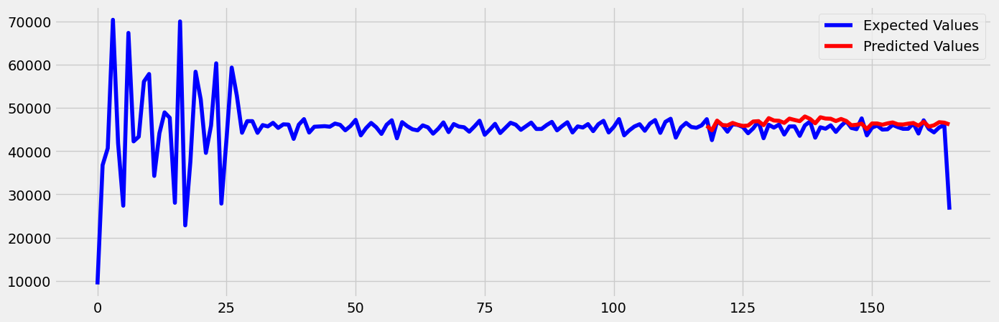

In [ ]:
predictions_series1 = pd.Series(predictions1, index=test1.index)
plt.figure(figsize=(15, 5))
plt.plot(actual1.index, actual1.values, label='Expected Values', color='blue')
plt.plot(predictions_series1.index, predictions_series1.values, label='Predicted Values', color='red')

plt.legend()

plt.show()

#### Model Evaluation

In [ ]:
# Evaluasi Model
mses1 = np.sqrt(mean_squared_error(test1, predictions1))
maes1 = mean_absolute_error(test1, predictions1)
r2s1 = r2_score(test1, predictions1)
print('ARIMA MSE: ', mses1)
print('ARIMA MAE: ', maes1)
print('ARIMA R2: ',r2s1)

ARIMA MSE:  3231.357727140875
ARIMA MAE:  1660.8062943381935
ARIMA R2:  -0.2134504549349403


### BritishMart

In [ ]:
# Menambahkan kolom 'minggu' berdasarkan 'tanggal'
BRITISH['minggu'] = BRITISH['tanggal'].dt.to_period('W').apply(lambda r: r.start_time)

# Menghitung pendapatan (jumlah total dari harga_pound) per minggu
pendapatan_per_minggu2 = BRITISH.groupby('minggu')['harga_pound'].sum().reset_index()

# Mengubah nama kolom untuk kejelasan
pendapatan_per_minggu2.columns = ['minggu', 'pendapatan_total']

# Menyimpan hasil ke file CSV baru
pendapatan_per_minggu2.to_csv('pendapatan_per_minggu.csv', index=False)

print(pendapatan_per_minggu2)

        minggu  pendapatan_total
0   2020-12-28          22147.46
1   2021-01-04          19336.80
2   2021-01-11          29878.90
3   2021-01-18          19732.04
4   2021-01-25          20278.96
..         ...               ...
161 2024-01-29          35539.00
162 2024-02-05          33203.17
163 2024-02-12          20799.67
164 2024-02-19          26059.26
165 2024-02-26          22519.61

[166 rows x 2 columns]


<ipython-input-140-49a5f8e96679>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import plotly.express as px
figure2 = px.line(pendapatan_per_minggu2, x='minggu', y='pendapatan_total', title='Pendapatan Perjualan Kuartal')
figure2.show()

<Figure size 640x480 with 0 Axes>

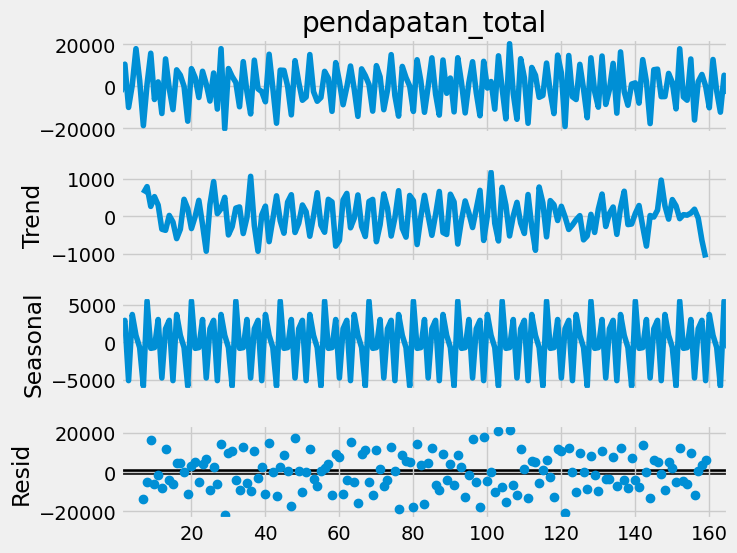

In [ ]:
import statsmodels.api as sm
pendapatan_per_minggu2_diff = pendapatan_per_minggu2.pendapatan_total.diff()
pendapatan_per_minggu2_diff = pendapatan_per_minggu2_diff.dropna()

dec2 = sm.tsa.seasonal_decompose(pendapatan_per_minggu2_diff,period = 12)
fig = plt.figure()
fig = dec2.plot()
fig.set_size_inches(8, 6)


In [ ]:
from statsmodels.tsa.stattools import adfuller
from numpy import log
result2 = adfuller(pendapatan_per_minggu2.pendapatan_total.dropna())
print('ADF Statistic: %f' % result2[0])
print('p-value: %f' % result2[1])

ADF Statistic: -5.924546
p-value: 0.000000


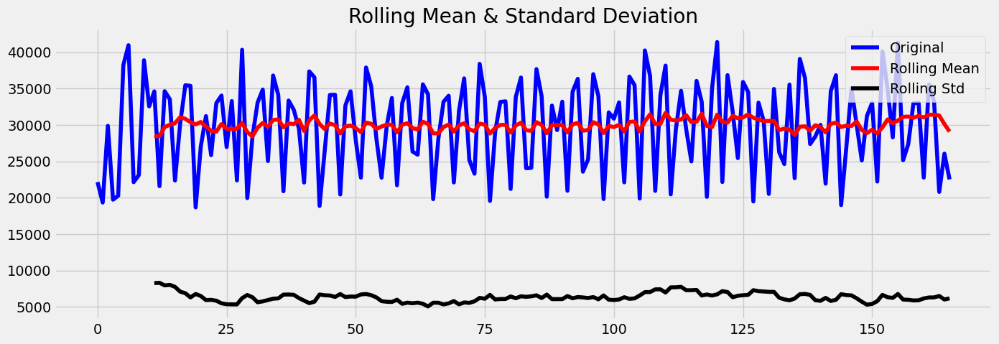

Results of Dickey-Fuller Test:
Test Statistic                -5.924546e+00
p-value                        2.461310e-07
#Lags Used                     9.000000e+00
Number of Observations Used    1.560000e+02
Critical Value (1%)           -3.472979e+00
Critical Value (5%)           -2.880252e+00
Critical Value (10%)          -2.576747e+00
dtype: float64


In [ ]:
test_stationarity(pendapatan_per_minggu2['pendapatan_total'])

karena nilai Test Statistic lebih negatif dari nilai kritis yang sesuai dan p-value sangat kecil, kita dapat menolak hipotesis nol bahwa data tidak stasioner. Oleh karena itu, kita memiliki bukti yang cukup untuk menyimpulkan bahwa data Anda stasioner.










* Test Statistic (-6.657115) lebih kecil (lebih negatif) daripada semua critical values pada tingkat signifikansi 1%, 5%, dan 10%.
* p-value (4.952135e-09) jauh di bawah 0.05, yang menunjukkan hasil yang sangat signifikan.

Ini berarti bahwa kita dapat menolak hipotesis nol dengan keyakinan yang sangat tinggi, menyimpulkan bahwa time series yang diuji tidak memiliki unit root dan merupakan stasioner.

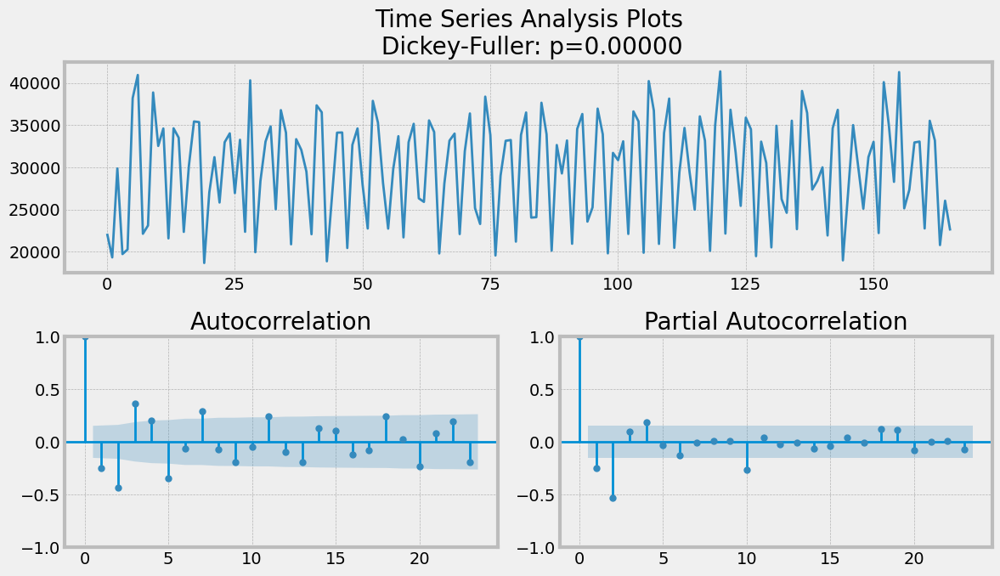

In [ ]:
import statsmodels.tsa.api as smt
data2 = pendapatan_per_minggu2
tsplot(data2['pendapatan_total'])

Dari plot di atas, urutan model ARIMA berikut dipilih dari kriteria yang disebutkan di atas:

*   p = 1
*   d = 0
*   q = 1







In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Ganti nilai order sesuai dengan yang diinginkan
model2 = ARIMA(data2['pendapatan_total'], order=(1, 0, 1))
model2_fit = model2.fit()
print(model2_fit.summary())

                               SARIMAX Results                                
Dep. Variable:       pendapatan_total   No. Observations:                  166
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1668.928
Date:                Sat, 08 Jun 2024   AIC                           3345.855
Time:                        02:04:35   BIC                           3358.303
Sample:                             0   HQIC                          3350.908
                                - 166                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.978e+04    186.271    159.880      0.000    2.94e+04    3.01e+04
ar.L1          0.2054      0.155      1.321      0.186      -0.099       0.510
ma.L1         -0.7011      0.114     -6.173      0.0

In [ ]:
actual2 = int(len(data2['pendapatan_total']))
actual2 = data2['pendapatan_total'][:actual2]
actual2

0      22147.46
1      19336.80
2      29878.90
3      19732.04
4      20278.96
         ...   
161    35539.00
162    33203.17
163    20799.67
164    26059.26
165    22519.61
Name: pendapatan_total, Length: 166, dtype: float64

In [ ]:
size2 = int(len(data2['pendapatan_total']) - 48)
train2, test2 = data2['pendapatan_total'][:size2], data2['pendapatan_total'][size2:]

print("Train set:")
print(train2)
print("\nTest set:")
print(test2)

Train set:
0      22147.46
1      19336.80
2      29878.90
3      19732.04
4      20278.96
         ...   
113    34687.51
114    29395.61
115    24993.33
116    36060.50
117    33183.75
Name: pendapatan_total, Length: 118, dtype: float64

Test set:
118    20119.02
119    34997.37
120    41394.78
121    22160.57
122    36846.55
123    31799.90
124    25447.97
125    35907.34
126    34525.10
127    19485.81
128    33067.00
129    30536.91
130    20522.31
131    34950.71
132    26254.26
133    24627.19
134    35547.62
135    22685.85
136    39074.77
137    36465.38
138    27381.01
139    28410.23
140    30014.01
141    21934.98
142    34647.85
143    36834.68
144    18987.88
145    26876.66
146    35026.26
147    30050.86
148    25114.17
149    31233.62
150    33039.25
151    22225.55
152    40118.25
153    34979.16
154    28295.53
155    41308.86
156    25154.76
157    27348.54
158    32967.95
159    33068.80
160    22767.44
161    35539.00
162    33203.17
163    20799.67
164    26059.2

In [ ]:
size2 = int(len(data2['pendapatan_total']) - 48)
train2, test2 = data2['pendapatan_total'][:size2], data2['pendapatan_total'][size2:]

print('\t ARIMA MODEL : In-Sample Forecasting \n')

history2 = [x for x in train2]
predictions2 = []

for obs2 in test2:
    model2 = ARIMA(history2, order=(1, 0, 1))
    model2_fit = model2.fit()

    output2 = model2_fit.forecast()
    yhat2 = output2[0]
    predictions2.append(float(yhat2))

    history2.append(obs2)

# Membuat DataFrame untuk hasil prediksi
results_df = pd.DataFrame({'Expected': test2, 'Predicted': predictions2})

# Mencetak tabel hasil prediksi
results_df

	 ARIMA MODEL : In-Sample Forecasting 



,Expected,Predicted
118,20119.02,25526.639795
119,34997.37,31748.794798
120,41394.78,28363.824533
121,22160.57,22219.496393
122,36846.55,28174.937073
123,31799.90,24781.424280
124,25447.97,25172.733503
125,35907.34,28759.960426
126,34525.10,25948.653361
127,19485.81,24830.817499


In [ ]:
size2 = int(len(data2['pendapatan_total']) - 48)
train2, test2 = data2['pendapatan_total'][:size2], data2['pendapatan_total'][size2:]

print('\t ARIMA MODEL : In-Sample Forecasting \n')

history2 = [x for x in train2]
predictions2 = []

for obs2 in test2:
    model2 = ARIMA(history2, order=(1, 0, 1))
    model2_fit = model2.fit()

    output2 = model2_fit.forecast()
    yhat2 = output2[0]
    predictions2.append(float(yhat2))

    history2.append(obs2)

    print('predicted = %f, expected = %f' % (yhat2, obs2))

	 ARIMA MODEL : In-Sample Forecasting 

predicted = 25526.639795, expected = 20119.020000
predicted = 31748.794798, expected = 34997.370000
predicted = 28363.824533, expected = 41394.780000
predicted = 22219.496393, expected = 22160.570000
predicted = 28174.937073, expected = 36846.550000
predicted = 24781.424280, expected = 31799.900000
predicted = 25172.733503, expected = 25447.970000
predicted = 28759.960426, expected = 35907.340000
predicted = 25948.653361, expected = 34525.100000
predicted = 24830.817499, expected = 19485.810000
predicted = 31679.685338, expected = 33067.000000
predicted = 29415.596812, expected = 30536.910000
predicted = 29159.849911, expected = 20522.310000
predicted = 34261.896744, expected = 34950.710000
predicted = 30229.963459, expected = 26254.260000
predicted = 31965.590533, expected = 24627.190000
predicted = 33917.692904, expected = 35547.620000
predicted = 29711.050643, expected = 22685.850000
predicted = 33307.024751, expected = 39074.770000
predicted 

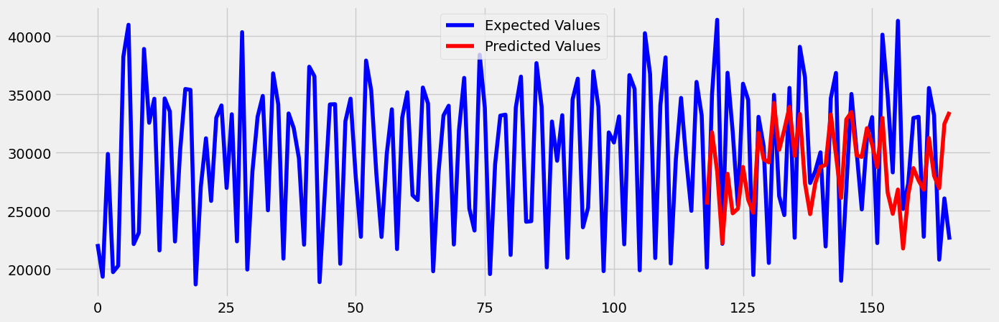

In [ ]:
predictions_series2 = pd.Series(predictions2, index=test2.index)
plt.figure(figsize=(15, 5))
plt.plot(actual2.index, actual2.values, label='Expected Values', color='blue')
plt.plot(predictions_series2.index, predictions_series2.values, label='Predicted Values', color='red')

plt.legend()

plt.show()

#### Model Evaluation

In [ ]:
# Evaluasi Model
mses2 = np.sqrt(mean_squared_error(test2, predictions2))
maes2 = mean_absolute_error(test2, predictions2)
r2s2 = r2_score(test2, predictions2)
print('ARIMA MSE: ', mses2)
print('ARIMA MAE: ', maes2)
print('ARIMA R2: ',r2s2)

ARIMA MSE:  6015.230158291135
ARIMA MAE:  4994.426322895109
ARIMA R2:  0.07370417249427841
